## PART 1

### Import the libraries

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import datetime as dt
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

### Import the data

In [93]:
train = pd.read_csv("C://Users/raghu/Desktop/Article_5/Data/train_hiring.csv")
train.loc[:,'Split'] = 'Train'
test = pd.read_csv("C://Users/raghu/Desktop/Article_5/Data/test_hiring.csv")
test.loc[:,'Split'] = 'Test'
test.loc[:,'Business_Sourced'] = np.NaN
data = pd.concat([train,test],sort=False).reset_index(drop=True)
del train
del test

### Basic Statistics

In [94]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Office_PIN,14572.0,445479.817046,234095.226219,110005.0,224122.0,411006.0,691008.0,851101.0
Applicant_City_PIN,14441.0,448548.652240,236930.997924,110001.0,226004.0,414106.0,695002.0,995657.0
Manager_Grade,13065.0,3.292767,1.094060,1.0,2.0,3.0,4.0,10.0
Manager_Num_Application,13065.0,2.127593,2.282490,0.0,0.0,2.0,3.0,22.0
Manager_Num_Coded,13065.0,0.870723,1.297834,0.0,0.0,0.0,1.0,10.0
Manager_Business,13065.0,160841.781630,246861.138496,-265289.0,0.0,84778.0,221090.0,3578265.0
Manager_Num_Products,13065.0,6.090011,7.594496,0.0,0.0,4.0,10.0,101.0
Manager_Business2,13065.0,155795.761194,241912.708969,-265289.0,0.0,81304.0,211941.0,3578265.0
Manager_Num_Products2,13065.0,5.956525,7.532118,0.0,0.0,4.0,9.0,101.0
Business_Sourced,9527.0,0.342920,0.474710,0.0,0.0,0.0,1.0,1.0


In [95]:
data.isna().sum()

ID                                0
Office_PIN                        0
Application_Receipt_Date          0
Applicant_City_PIN              131
Applicant_Gender                 89
Applicant_BirthDate              96
Applicant_Marital_Status        103
Applicant_Occupation           2225
Applicant_Qualification         130
Manager_DOJ                    1507
Manager_Joining_Designation    1507
Manager_Current_Designation    1507
Manager_Grade                  1507
Manager_Status                 1507
Manager_Gender                 1507
Manager_DoB                    1507
Manager_Num_Application        1507
Manager_Num_Coded              1507
Manager_Business               1507
Manager_Num_Products           1507
Manager_Business2              1507
Manager_Num_Products2          1507
Business_Sourced               5045
Split                             0
dtype: int64

### Manager Gender

In [96]:
data['Manager_Gender'].value_counts()

M    11321
F     1744
Name: Manager_Gender, dtype: int64

In [97]:
data['Manager_Gender'].isna().sum()

1507

In [98]:
len(data)

14572

In [99]:
def replace_cat_list(df,col,cat_list):
    count_cat_dict_initial = {'Total_cat':0}
    for cat in cat_list:
        count_cat_dict_initial[cat] = df.loc[df[col]==cat,col].count()
        count_cat_dict_initial['Total_cat'] = count_cat_dict_initial.get('Total_cat') + count_cat_dict_initial[cat]
    count_cat_dict_initial['Total'] = len(df[col])
    count_cat_dict_final = {'Total_cat':0}
    for cat in cat_list[:-1]:
        count_cat_dict_final[cat] = int((count_cat_dict_initial.get(cat)/count_cat_dict_initial.get('Total_cat'))*count_cat_dict_initial.get('Total'))
        count_cat_dict_final['Total_cat'] = count_cat_dict_final.get('Total_cat') + count_cat_dict_final[cat]
    count_cat_dict_final[cat_list[-1]] = count_cat_dict_initial['Total'] - count_cat_dict_final['Total_cat']
    fill_dict = {}
    for cat in cat_list:
        fill_dict[cat] = count_cat_dict_final[cat] - count_cat_dict_initial[cat]
    for cat in cat_list[:-1]:
        fill_index = find_index_(df,fill_dict.get(cat),col)
        df.loc[0:fill_index,col] = df.loc[0:fill_index,col].fillna(cat)
    df.loc[:,col] = df.loc[:,col].fillna(cat_list[-1])
    return df

def find_index_(df,to_find,col):
    min_=1
    max_=len(df)
    to_find=to_find
    while(min_<max_):
        mid=int((min_+max_)/2)
        if((df[1:mid][col].isna().sum()==to_find)and((df[col][(mid-1):mid].isna()).values)):
            return mid
        elif((df[1:mid][col].isna().sum()>to_find)or(df[1:mid][col].isna().sum()==to_find)):
            max_=mid-1
        else:
            min_=mid+1
        if(max_==min_):
            if((df[1:min_][col].isna().sum()==to_find)and((df[col][(min_-1):min_].isna()).values)):
                return min_

In [100]:
def encode_data(df,col):
    category = data[col].value_counts().index
    range_ = range(1,1+(len(category)),1)
    return dict(zip(category,range_))

In [101]:
# Gender
data = replace_cat_list(data,'Manager_Gender',['M','F'])
data['Manager_Gender'] = data['Manager_Gender'].replace(encode_data(data,'Manager_Gender'))
data['Manager_Gender'] = data['Manager_Gender'].astype('int').astype('object')

In [102]:
data['Manager_Gender'].isna().sum()

0

In [103]:
data['Manager_Gender'].value_counts()

1    12626
2     1946
Name: Manager_Gender, dtype: int64

### Applicant_Marital_status

In [104]:
data['Applicant_Marital_Status'].isna().sum()

103

In [105]:
data['Applicant_Marital_Status'].value_counts()

M    10266
S     4174
W       18
D       11
Name: Applicant_Marital_Status, dtype: int64

In [106]:
def to_replace(df,col,number):
    x = df[col].value_counts()[ df[col].value_counts() < number].index.values
    df[col] = df[col].replace(x,np.NAN)
    return df

In [107]:
data = to_replace(data,'Applicant_Marital_Status',20)

In [108]:
data['Applicant_Marital_Status'].isna().sum()

132

In [109]:
data['Applicant_Marital_Status'].value_counts()

M    10266
S     4174
Name: Applicant_Marital_Status, dtype: int64

In [110]:
data = replace_cat_list(data,'Applicant_Marital_Status',['M','S'])
data['Applicant_Marital_Status'] = data['Applicant_Marital_Status'].replace(encode_data(data,'Applicant_Marital_Status'))
data['Applicant_Marital_Status'] = data['Applicant_Marital_Status'].astype('int').astype('object')

In [111]:
# Gender
data = replace_cat_list(data,'Applicant_Gender',['M','F'])
data['Applicant_Gender'] = data['Applicant_Gender'].replace(encode_data(data,'Applicant_Gender'))
data['Applicant_Gender'] = data['Applicant_Gender'].astype('int').astype('object')

# App Qulification 
data = to_replace(data,'Applicant_Qualification',7)
data = replace_cat_list(data,'Applicant_Qualification',['Class XII','Graduate'])
data['Applicant_Qualification'] = data['Applicant_Qualification'].replace(encode_data(data,'Applicant_Qualification'))
data['Applicant_Qualification'] = data['Applicant_Qualification'].astype('int').astype('object')

#occupation 
data = replace_cat_list(data,'Applicant_Occupation',['Salaried','Business','Others','Self Employed','Student'])
data['Applicant_Occupation'] = data['Applicant_Occupation'].fillna('Salaried')
data['Applicant_Occupation'] = data['Applicant_Occupation'].replace(encode_data(data,'Applicant_Occupation'))
data['Applicant_Occupation'] = data['Applicant_Occupation'].astype('int').astype('object')

# Manager Promotion 
level_dict = {'Level 1':1,'Level 2':2,'Level 3':3,'Level 4':3,'Other':0,'Level 6':6,'Level 5':5,'Level 7':7}
data['Manager_Joining_Designation'] = data['Manager_Joining_Designation'].replace(level_dict)
data['Manager_Current_Designation'] = data['Manager_Current_Designation'].replace(level_dict)
data['Manager_Promotion'] = data['Manager_Current_Designation'] - data['Manager_Joining_Designation']

# M_J_D
data = replace_cat_list(data,'Manager_Joining_Designation',[1,2,3,4,0,6,5])
data = replace_cat_list(data,'Manager_Current_Designation',[2,3,1,4,5])
data.loc[ data['Manager_Promotion'].isna(), 'Manager_Promotion' ] = data['Manager_Current_Designation'] - data['Manager_Joining_Designation']
data['Manager_Joining_Designation'] = data['Manager_Joining_Designation'].replace([6,5,7],0)
data['Manager_Joining_Designation'] = data['Manager_Joining_Designation'].replace(encode_data(data,'Manager_Joining_Designation'))
data['Manager_Current_Designation'] = data['Manager_Current_Designation'].replace(encode_data(data,'Manager_Current_Designation'))
data['Manager_Joining_Designation'] = data['Manager_Joining_Designation'].astype('int').astype('object')
data['Manager_Current_Designation'] = data['Manager_Current_Designation'].astype('int').astype('object')

# Manager grade
data = to_replace(data,'Manager_Grade',40)
data = replace_cat_list(data,'Manager_Grade',[3,4,2,5,6])
data['Manager_Grade'] = data['Manager_Grade'].replace(encode_data(data,'Manager_Grade'))
data['Manager_Grade'] = data['Manager_Grade'].astype('int').astype('object')

# Manager Status 
data = replace_cat_list(data,'Manager_Status',['Confirmation','Probation'])
data['Manager_Status'] = data['Manager_Status'].replace(encode_data(data,'Manager_Status'))
data['Manager_Status'] = data['Manager_Status'].astype('int').astype('object')

# Manager Application 
data = to_replace(data,'Manager_Num_Application',40)
data = replace_cat_list(data,'Manager_Num_Application',[0,1,2,3,4,5,6,7,8,9])
data['Manager_Num_Application'] = data['Manager_Num_Application'].replace(encode_data(data,'Manager_Num_Application'))
data['Manager_Num_Application'] = data['Manager_Num_Application'].astype('int').astype('object')

# Manager Num Coded
data = to_replace(data,'Manager_Num_Coded',50)
data = replace_cat_list(data,'Manager_Num_Coded',[0,1,2,3,4,5])
data['Manager_Num_Coded'] = data['Manager_Num_Coded'].replace(encode_data(data,'Manager_Num_Coded'))
data['Manager_Num_Coded'] = data['Manager_Num_Coded'].astype('int').astype('object')

# Manager Number of Products
data = to_replace(data,'Manager_Num_Products',16)
data = replace_cat_list(data,'Manager_Num_Products',[0,6,5,4,7,3,8,1,2,9])
data['Manager_Num_Products'] = data['Manager_Num_Products'].replace(encode_data(data,'Manager_Num_Products'))
data['Manager_Num_Products'] = data['Manager_Num_Products'].astype('int').astype('object')

# manager num products 2
data = to_replace(data,'Manager_Num_Products2',16)
data = replace_cat_list(data,'Manager_Num_Products2',[0,6,5,4,7,3,1,2,8,9])
data['Manager_Num_Products2'] = data['Manager_Num_Products2'].replace(encode_data(data,'Manager_Num_Products2'))
data['Manager_Num_Products2'] = data['Manager_Num_Products2'].astype('int').astype('object')

# Manager Business
data['Manager_Business'] = pd.cut(data['Manager_Business'],10, labels=range(1,11,1))
data['Manager_Business'] = data['Manager_Business'].replace(to_replace=[6,7,8,9,10], value=5)
data = replace_cat_list(data,'Manager_Business',[1,2,3,4,5])
data['Manager_Business'] = data['Manager_Business'].replace(encode_data(data,'Manager_Business'))
data['Manager_Business'] = data['Manager_Business'].astype('int').astype('object')

# Manager Business2
data['Manager_Business2'] = pd.cut(data['Manager_Business2'],10, labels=range(1,11,1))
data['Manager_Business2'] = data['Manager_Business2'].replace(to_replace=[6,7,8,9,10], value=5)
data = replace_cat_list(data,'Manager_Business2',[1,2,3,4,5])
data['Manager_Business2'] = data['Manager_Business2'].replace(encode_data(data,'Manager_Business2'))
data['Manager_Business2'] = data['Manager_Business2'].astype('int').astype('object')

# Appl Citypin
data['Applicant_City_PIN'] = pd.cut(data['Applicant_City_PIN'],10, labels=range(1,11,1))
data['Applicant_City_PIN'] = data['Applicant_City_PIN'].replace(to_replace=[10], value=9)
data = replace_cat_list(data,'Applicant_City_PIN',[2,4,1,7,9,8,5])
data['Applicant_City_PIN'] = data['Applicant_City_PIN'].replace(encode_data(data,'Applicant_City_PIN'))
data['Applicant_City_PIN'] = data['Applicant_City_PIN'].astype('int').astype('object')

#Applicant birth date
data['Applicant_BirthDate'] = data['Applicant_BirthDate'].dropna().apply(lambda x : dt.datetime.strptime(x,'%m/%d/%Y'))
data['Applicant_BirthDate'] = pd.cut(data['Applicant_BirthDate'],10, labels=range(1,11,1))
data['Applicant_BirthDate'] = data['Applicant_BirthDate'].replace({9:8,10:8,1:2})
data = replace_cat_list(data,'Applicant_BirthDate',[7,6,8,5,4,3,2])
data['Applicant_BirthDate'] = data['Applicant_BirthDate'].replace(encode_data(data,'Applicant_BirthDate'))
data['Applicant_BirthDate'] = data['Applicant_BirthDate'].astype('int').astype('object')

# manager DOJ
data['Manager_DOJ'] = data['Manager_DOJ'].dropna().apply(lambda x : dt.datetime.strptime(x,'%m/%d/%Y'))
data['Manager_DOJ'] = pd.cut(data['Manager_DOJ'],10, labels=range(1,11,1))
data = replace_cat_list(data,'Manager_DOJ',[9,10,7,8,4,3,6,5,1,2])
data['Manager_DOJ'] = data['Manager_DOJ'].replace(encode_data(data,'Manager_DOJ'))
data['Manager_DOJ'] = data['Manager_DOJ'].astype('int').astype('object')

# manager Dob
data['Manager_DoB'] = data['Manager_DoB'].dropna().apply(lambda x : dt.datetime.strptime(x,'%m/%d/%Y'))
data['Manager_DoB'] = pd.cut(data['Manager_DoB'],10, labels=range(1,11,1))
data['Manager_DoB'] = data['Manager_DoB'].replace([1,2],3)
data = replace_cat_list(data,'Manager_DoB',[7,8,6,9,5,4,3])
data['Manager_DoB'] = data['Manager_DoB'].replace(encode_data(data,'Manager_DoB'))
data['Manager_DoB'] = data['Manager_DoB'].astype('int').astype('object')

# Applicant receipt date
data['Application_Receipt_Date'] = data['Application_Receipt_Date'].apply(lambda x : dt.datetime.strptime(x,'%m/%d/%Y'))
data['Application_Receipt_Date'] = pd.cut(data['Application_Receipt_Date'],10, labels=range(1,11,1))
data['Application_Receipt_Date'] = data['Application_Receipt_Date'].replace(encode_data(data,'Application_Receipt_Date'))
data['Application_Receipt_Date'] = data['Application_Receipt_Date'].astype('int').astype('object')

#office pin 
data['Office_PIN'] = pd.cut(data['Office_PIN'],10, labels=range(1,11,1))
data['Office_PIN'] = data['Office_PIN'].replace(encode_data(data,'Office_PIN'))
data['Office_PIN'] = data['Office_PIN'].astype('int').astype('object')


In [112]:
train = data.loc[data['Split']=='Train',data.columns.difference(['Split'])].set_index('ID')

In [113]:
test = data.loc[data['Split']=='Test',data.columns.difference(['Split','Business_Sourced'])].set_index('ID')

In [114]:
del data

In [44]:
X_train, X_validation, y_train, y_validation = \
        train_test_split(train.drop('Business_Sourced',axis=1), train['Business_Sourced'], train_size=0.7, random_state=1234)

In [45]:
from catboost import CatBoostClassifier

In [26]:
catboost=CatBoostClassifier(early_stopping_rounds=50,\
        cat_features=train.dtypes[train.dtypes == 'category'].index,custom_metric=['AUC:hints=skip_train~false'])
grid = {'learning_rate': [0.01,0.03,0.05,0.07,0.09,0.1],
        'depth': [4,6,8,10],
        'l2_leaf_reg': [1, 3, 5, 7, 9],
        'iterations'    : [150,200,300,400]}

grid_search_result = catboost.grid_search(grid, X=X_train, y=y_train,cv=5,  plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 0.6412703907
bestIteration = 149

0:	loss: 0.6412704	best: 0.6412704 (0)	total: 2.24s	remaining: 17m 51s

bestTest = 0.6358012719
bestIteration = 148

1:	loss: 0.6358013	best: 0.6358013 (1)	total: 4.45s	remaining: 17m 44s

bestTest = 0.6334298673
bestIteration = 128

2:	loss: 0.6334299	best: 0.6334299 (2)	total: 6.58s	remaining: 17m 27s

bestTest = 0.6337558522
bestIteration = 146

3:	loss: 0.6337559	best: 0.6334299 (2)	total: 8.64s	remaining: 17m 8s

bestTest = 0.632670797
bestIteration = 137

4:	loss: 0.6326708	best: 0.6326708 (4)	total: 10.7s	remaining: 16m 54s

bestTest = 0.6338046211
bestIteration = 125

5:	loss: 0.6338046	best: 0.6326708 (4)	total: 12.8s	remaining: 16m 48s

bestTest = 0.6415202027
bestIteration = 149

6:	loss: 0.6415202	best: 0.6326708 (4)	total: 14.7s	remaining: 16m 31s

bestTest = 0.6350398088
bestIteration = 149

7:	loss: 0.6350398	best: 0.6326708 (4)	total: 16.7s	remaining: 16m 25s

bestTest = 0.6343469561
bestIteration = 102

8:	loss: 0.6343470	b

Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6327941868
bestIteration = 145

65:	loss: 0.6327942	best: 0.6310264 (41)	total: 5m 22s	remaining: 33m 41s

bestTest = 0.6364084464
bestIteration = 299

66:	loss: 0.6364084	best: 0.6310264 (41)	total: 5m 32s	remaining: 34m 9s

bestTest = 0.6334610838
bestIteration = 299

67:	loss: 0.6334611	best: 0.6310264 (41)	total: 5m 42s	remaining: 34m 38s

bestTest = 0.6325477816
bestIteration = 267

68:	loss: 0.6325478	best: 0.6310264 (41)	total: 5m 53s	remaining: 35m 5s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6325455235
bestIteration = 194

69:	loss: 0.6325455	best: 0.6310264 (41)	total: 6m 2s	remaining: 35m 22s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6336328306
bestIteration = 159

70:	loss: 0.6336328	best: 0.6310264 (41)	total: 6m 10s	remaining: 35m 34s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6310264372
bestIteration = 144

71:	loss: 0.6310264	b

Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6333414689
bestIteration = 188

119:	loss: 0.6333415	best: 0.6310264 (41)	total: 14m 12s	remaining: 42m 37s

bestTest = 0.6403219964
bestIteration = 149

120:	loss: 0.6403220	best: 0.6310264 (41)	total: 14m 16s	remaining: 42m 20s

bestTest = 0.6341392627
bestIteration = 121

121:	loss: 0.6341393	best: 0.6310264 (41)	total: 14m 21s	remaining: 42m 6s

bestTest = 0.6326854723
bestIteration = 137

122:	loss: 0.6326855	best: 0.6310264 (41)	total: 14m 25s	remaining: 41m 52s

bestTest = 0.6310304305
bestIteration = 103

123:	loss: 0.6310304	best: 0.6310264 (41)	total: 14m 30s	remaining: 41m 39s

bestTest = 0.630769721
bestIteration = 144

124:	loss: 0.6307697	best: 0.6307697 (124)	total: 14m 35s	remaining: 41m 25s

bestTest = 0.6324201224
bestIteration = 115

125:	loss: 0.6324201	best: 0.6307697 (124)	total: 14m 40s	remaining: 41m 12s

bestTest = 0.6407268097
bestIteration = 149

126:	loss: 0.6407268	best: 0.6307697 (124)	tot

Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6318627771
bestIteration = 141

178:	loss: 0.6318628	best: 0.6296543 (155)	total: 23m 13s	remaining: 39m 3s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6303722401
bestIteration = 111

179:	loss: 0.6303722	best: 0.6296543 (155)	total: 23m 27s	remaining: 39m 6s

bestTest = 0.6343429142
bestIteration = 299

180:	loss: 0.6343429	best: 0.6296543 (155)	total: 23m 51s	remaining: 39m 25s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6311489833
bestIteration = 248

181:	loss: 0.6311490	best: 0.6296543 (155)	total: 24m 17s	remaining: 39m 46s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6328132714
bestIteration = 158

182:	loss: 0.6328133	best: 0.6296543 (155)	total: 24m 35s	remaining: 39m 54s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6320654135
bestIteration = 139

183:	loss: 0.6320654	best: 0.6296543 (155)	total: 24m 51s	remaining: 39

Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6319937991
bestIteration = 138

230:	loss: 0.6319938	best: 0.6296543 (155)	total: 39m 8s	remaining: 42m 11s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6330731357
bestIteration = 103

231:	loss: 0.6330731	best: 0.6296543 (155)	total: 39m 19s	remaining: 42m 2s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6349202754
bestIteration = 78

232:	loss: 0.6349203	best: 0.6296543 (155)	total: 39m 29s	remaining: 41m 52s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6316294788
bestIteration = 95

233:	loss: 0.6316295	best: 0.6296543 (155)	total: 39m 40s	remaining: 41m 42s

bestTest = 0.6339965533
bestIteration = 399

234:	loss: 0.6339966	best: 0.6296543 (155)	total: 40m 9s	remaining: 41m 52s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6320531168
bestIteration = 290

235:	loss: 0.6320531	best: 0.6296543 (155)	total: 40m 35s	remaining: 41m 5


bestTest = 0.6311375711
bestIteration = 155

283:	loss: 0.6311376	best: 0.6288493 (244)	total: 51m 41s	remaining: 35m 40s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6328612083
bestIteration = 138

284:	loss: 0.6328612	best: 0.6288493 (244)	total: 52m 6s	remaining: 35m 38s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6339569019
bestIteration = 43

285:	loss: 0.6339569	best: 0.6288493 (244)	total: 52m 17s	remaining: 35m 27s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6316956928
bestIteration = 75

286:	loss: 0.6316957	best: 0.6288493 (244)	total: 52m 33s	remaining: 35m 20s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6330933403
bestIteration = 87

287:	loss: 0.6330933	best: 0.6288493 (244)	total: 52m 49s	remaining: 35m 12s

bestTest = 0.6363076976
bestIteration = 199

288:	loss: 0.6363077	best: 0.6288493 (244)	total: 53m 10s	remaining: 35m 8s

bestTest = 0.6312273515
bestIteration = 196

289:	

Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6315233385
bestIteration = 48

334:	loss: 0.6315233	best: 0.6288493 (244)	total: 1h 9m 36s	remaining: 30m 7s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6353029299
bestIteration = 67

335:	loss: 0.6353029	best: 0.6288493 (244)	total: 1h 9m 50s	remaining: 29m 56s

bestTest = 0.632775895
bestIteration = 396

336:	loss: 0.6327759	best: 0.6288493 (244)	total: 1h 10m 37s	remaining: 29m 58s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6320032813
bestIteration = 130

337:	loss: 0.6320033	best: 0.6288493 (244)	total: 1h 10m 55s	remaining: 29m 47s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6319079801
bestIteration = 144

338:	loss: 0.6319080	best: 0.6288493 (244)	total: 1h 11m 19s	remaining: 29m 39s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6337636273
bestIteration = 88

339:	loss: 0.6337636	best: 0.6288493 (244)	total: 1h 11m 36s	


bestTest = 0.6325411628
bestIteration = 149

385:	loss: 0.6325412	best: 0.6288493 (244)	total: 1h 20m 28s	remaining: 19m 35s

bestTest = 0.6312090244
bestIteration = 135

386:	loss: 0.6312090	best: 0.6288493 (244)	total: 1h 20m 29s	remaining: 19m 20s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6354106869
bestIteration = 42

387:	loss: 0.6354107	best: 0.6288493 (244)	total: 1h 20m 31s	remaining: 19m 5s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6315739719
bestIteration = 69

388:	loss: 0.6315740	best: 0.6288493 (244)	total: 1h 20m 32s	remaining: 18m 50s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6339641053
bestIteration = 47

389:	loss: 0.6339641	best: 0.6288493 (244)	total: 1h 20m 33s	remaining: 18m 35s

bestTest = 0.6358845449
bestIteration = 199

390:	loss: 0.6358845	best: 0.6288493 (244)	total: 1h 20m 43s	remaining: 18m 22s

bestTest = 0.630201124
bestIteration = 195

391:	loss: 0.6302011	best: 0.6288493 (244

Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6322412378
bestIteration = 73

436:	loss: 0.6322412	best: 0.6269070 (433)	total: 1h 28m 35s	remaining: 8m 43s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6360264828
bestIteration = 21

437:	loss: 0.6360265	best: 0.6269070 (433)	total: 1h 28m 40s	remaining: 8m 30s

bestTest = 0.6324144175
bestIteration = 296

438:	loss: 0.6324144	best: 0.6269070 (433)	total: 1h 28m 57s	remaining: 8m 18s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6317227287
bestIteration = 185

439:	loss: 0.6317227	best: 0.6269070 (433)	total: 1h 29m 12s	remaining: 8m 6s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6314546454
bestIteration = 105

440:	loss: 0.6314546	best: 0.6269070 (433)	total: 1h 29m 23s	remaining: 7m 54s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6332760709
bestIteration = 55

441:	loss: 0.6332761	best: 0.6269070 (433)	total: 1h 29m 29s	re

In [29]:
grid_search_result['params']

{'depth': 10, 'l2_leaf_reg': 5, 'iterations': 300, 'learning_rate': 0.03}

In [46]:
catboost=CatBoostClassifier(early_stopping_rounds=50,\
        cat_features=train.dtypes[train.dtypes == 'category'].index,custom_metric=['AUC:hints=skip_train~false'],\
                            iterations=300, learning_rate=0.03, depth=10, l2_leaf_reg=5)
catboost.fit(X_train, y_train,eval_set=(X_validation, y_validation),plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6891512	test: 0.6895712	best: 0.6895712 (0)	total: 84ms	remaining: 25.1s
1:	learn: 0.6851108	test: 0.6858685	best: 0.6858685 (1)	total: 91.5ms	remaining: 13.6s
2:	learn: 0.6810796	test: 0.6825491	best: 0.6825491 (2)	total: 102ms	remaining: 10.1s
3:	learn: 0.6762102	test: 0.6791165	best: 0.6791165 (3)	total: 110ms	remaining: 8.13s
4:	learn: 0.6735221	test: 0.6762911	best: 0.6762911 (4)	total: 114ms	remaining: 6.74s
5:	learn: 0.6699862	test: 0.6732770	best: 0.6732770 (5)	total: 121ms	remaining: 5.95s
6:	learn: 0.6663632	test: 0.6705690	best: 0.6705690 (6)	total: 129ms	remaining: 5.39s
7:	learn: 0.6614024	test: 0.6680269	best: 0.6680269 (7)	total: 136ms	remaining: 4.98s
8:	learn: 0.6594621	test: 0.6659150	best: 0.6659150 (8)	total: 141ms	remaining: 4.56s
9:	learn: 0.6567607	test: 0.6638040	best: 0.6638040 (9)	total: 147ms	remaining: 4.27s
10:	learn: 0.6544045	test: 0.6617348	best: 0.6617348 (10)	total: 154ms	remaining: 4.04s
11:	learn: 0.6516135	test: 0.6595829	best: 0.6595829

116:	learn: 0.5154112	test: 0.6144440	best: 0.6144438 (114)	total: 803ms	remaining: 1.25s
117:	learn: 0.5146414	test: 0.6142618	best: 0.6142618 (117)	total: 809ms	remaining: 1.25s
118:	learn: 0.5132331	test: 0.6140750	best: 0.6140750 (118)	total: 816ms	remaining: 1.24s
119:	learn: 0.5127763	test: 0.6140268	best: 0.6140268 (119)	total: 824ms	remaining: 1.24s
120:	learn: 0.5120014	test: 0.6140002	best: 0.6140002 (120)	total: 831ms	remaining: 1.23s
121:	learn: 0.5115095	test: 0.6139204	best: 0.6139204 (121)	total: 837ms	remaining: 1.22s
122:	learn: 0.5111434	test: 0.6138921	best: 0.6138921 (122)	total: 843ms	remaining: 1.21s
123:	learn: 0.5103083	test: 0.6140228	best: 0.6138921 (122)	total: 849ms	remaining: 1.2s
124:	learn: 0.5099859	test: 0.6138941	best: 0.6138921 (122)	total: 855ms	remaining: 1.2s
125:	learn: 0.5094994	test: 0.6138500	best: 0.6138500 (125)	total: 860ms	remaining: 1.19s
126:	learn: 0.5087375	test: 0.6136045	best: 0.6136045 (126)	total: 866ms	remaining: 1.18s
127:	learn: 

In [47]:
from sklearn import metrics

In [48]:
print("Training roc_auc score is :",metrics.roc_auc_score(y_train, catboost.predict(X_train)))
print()
print("Testing roc_auc score is :",metrics.roc_auc_score(y_validation, catboost.predict(X_validation)))

Training roc_auc score is : 0.6742102057774589

Testing roc_auc score is : 0.531479538300105


Training Confusion Matrix


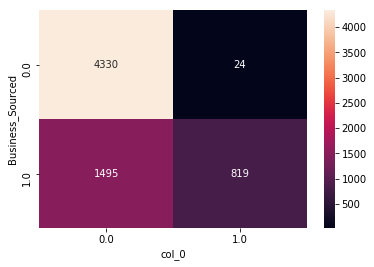

In [49]:
print("Training Confusion Matrix")
sns.heatmap(pd.crosstab(y_train, catboost.predict(X_train)), annot=True, fmt='.0f')

Testing Consfusion Matrix


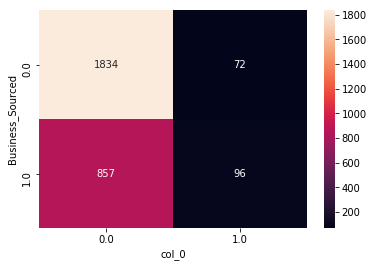

In [50]:
print("Testing Consfusion Matrix")
sns.heatmap(pd.crosstab(y_validation, catboost.predict(X_validation)), annot=True, fmt='.0f')

In [51]:
train_predict=pd.DataFrame(columns=['actual','prob'])
train_predict['actual']=y_train
train_predict['prob']=catboost.predict_proba(X_train)
train_predict.head()

,actual,prob
FIN1003639,0.0,0.737895
FIN1004488,1.0,0.645841
FIN1001684,1.0,0.507526
FIN1001230,0.0,0.770561
FIN1008019,1.0,0.456027


In [52]:
test_predict=pd.DataFrame(columns=['actual','prob'])
test_predict['actual']=y_validation
test_predict['prob']=catboost.predict_proba(X_validation)
test_predict.head()

,actual,prob
FIN1006254,1.0,0.612329
FIN1000397,0.0,0.768408
FIN1007154,1.0,0.615543
FIN1007200,1.0,0.658790
FIN1003265,0.0,0.735625


In [33]:
## Intuition behind ROC curve - confusion matrix for each different cut-off shows trade off in sensitivity and specificity
roc_like_df = pd.DataFrame()
train_temp = train_predict.copy()
i=0
for cut_off in np.linspace(0,1,50):
    train_temp['cut_off'] = cut_off
    train_temp['predicted'] = train_temp['prob'].apply(lambda x: 0.0 if x > cut_off else 1.0)
    train_temp['tp'] = train_temp.apply(lambda x: 1.0 if x['actual']==1.0 and x['predicted']==1 else 0.0, axis=1)
    train_temp['fp'] = train_temp.apply(lambda x: 1.0 if x['actual']==0.0 and x['predicted']==1 else 0.0, axis=1)
    train_temp['tn'] = train_temp.apply(lambda x: 1.0 if x['actual']==0.0 and x['predicted']==0 else 0.0, axis=1)
    train_temp['fn'] = train_temp.apply(lambda x: 1.0 if x['actual']==1.0 and x['predicted']==0 else 0.0, axis=1)
    sensitivity = train_temp['tp'].sum() / (train_temp['tp'].sum() + train_temp['fn'].sum())
    specificity = train_temp['tn'].sum() / (train_temp['tn'].sum() + train_temp['fp'].sum())
    roc_like_table = pd.DataFrame([cut_off, sensitivity, specificity]).T
    roc_like_table.columns = ['cutoff', 'sensitivity', 'specificity']
    roc_like_df = pd.concat([roc_like_df, roc_like_table], axis=0)
    i=i+1


In [34]:
roc_like_df.head()

,cutoff,sensitivity,specificity
0,0.000000,0.0,1.0
0,0.020408,0.0,1.0
0,0.040816,0.0,1.0
0,0.061224,0.0,1.0
0,0.081633,0.0,1.0


In [35]:
import matplotlib.pyplot as plt

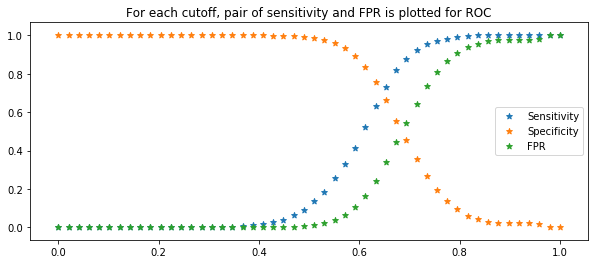

In [36]:
plt.subplots(figsize=(10,4))
plt.scatter(roc_like_df['cutoff'], roc_like_df['sensitivity'], marker='*', label='Sensitivity')
plt.scatter(roc_like_df['cutoff'], roc_like_df['specificity'], marker='*', label='Specificity')
plt.scatter(roc_like_df['cutoff'], 1-roc_like_df['specificity'], marker='*', label='FPR')
plt.title('For each cutoff, pair of sensitivity and FPR is plotted for ROC')
plt.legend()

In [37]:
## Finding ideal cut-off for checking if this remains same in OOS validation
roc_like_df['total'] = roc_like_df['sensitivity'] + roc_like_df['specificity']
roc_like_df[roc_like_df['total']==roc_like_df['total'].max()]

,cutoff,sensitivity,specificity,total
0,0.653061,0.731201,0.661461,1.392662


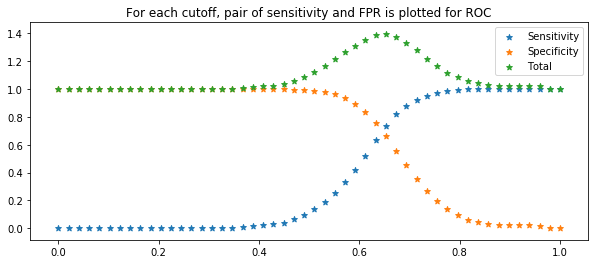

In [39]:
plt.subplots(figsize=(10,4))
plt.scatter(roc_like_df['cutoff'], roc_like_df['sensitivity'], marker='*', label='Sensitivity')
plt.scatter(roc_like_df['cutoff'], roc_like_df['specificity'], marker='*', label='Specificity')
plt.scatter(roc_like_df['cutoff'], roc_like_df['total'] , marker='*', label='Total')
plt.title('For each cutoff, pair of sensitivity and FPR is plotted for ROC')
plt.legend()

In [41]:
cut=round(roc_like_df[roc_like_df['total']==roc_like_df['total'].max()].cutoff[0],5)

In [42]:
test_predict['predicted'] = test_predict['prob'].apply(lambda x: 1 if x < cut else 0)
train_predict['predicted'] = train_predict['prob'].apply(lambda x: 1 if x < cut else 0)

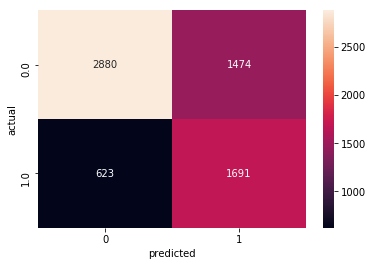

In [43]:
sns.heatmap(pd.crosstab(train_predict['actual'], train_predict['predicted']), annot=True, fmt='.0f')

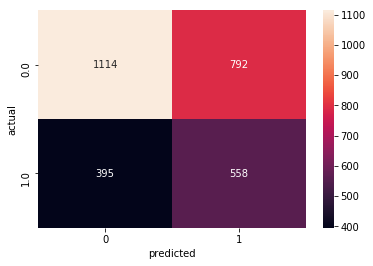

In [44]:
sns.heatmap(pd.crosstab(test_predict['actual'], test_predict['predicted']), annot=True, fmt='.0f')

In [45]:
print("Training roc_auc score is :",metrics.roc_auc_score(train_predict.actual,train_predict.predicted ))
print()
print("Testing roc_auc score is :",metrics.roc_auc_score(test_predict.actual,test_predict.predicted))

Training roc_auc score is : 0.696114978269319

Testing roc_auc score is : 0.5849947534102834


In [46]:
print("The overall accuracy score for the Train Data is : ", metrics.accuracy_score(train_predict.actual,train_predict.predicted ))
print("The overall accuracy score for the Test Data  is : ", metrics.accuracy_score(test_predict.actual,test_predict.predicted))

The overall accuracy score for the Train Data is :  0.6855128974205159
The overall accuracy score for the Test Data  is :  0.5848198670863939


In [47]:
roc_auc_dict = {}
for roc_cutoff in roc_like_df['cutoff'].values:
    roc_auc_dict[roc_cutoff] = {}
    train_metric = train_predict['prob'].apply(lambda x: 1 if x < roc_cutoff else 0)
    roc_auc_dict[roc_cutoff]['train'] = metrics.roc_auc_score(train_predict.actual,train_metric )
    test_metric = test_predict['prob'].apply(lambda x: 1 if x < roc_cutoff else 0)
    roc_auc_dict[roc_cutoff]['test'] = metrics.roc_auc_score(test_predict.actual,test_metric )

In [48]:
roc_df = pd.DataFrame.from_dict(roc_auc_dict,orient='index').reset_index()

In [49]:
roc_df.loc[roc_df['train'].argmax(),:]

index    0.653061
train    0.696331
test     0.584995
Name: 32, dtype: float64

In [50]:
roc_df.loc[roc_df['test'].argmax(),:]

index    0.653061
train    0.696331
test     0.584995
Name: 32, dtype: float64

In [51]:
test_predict['predicted_roc'] = test_predict['prob'].apply(lambda x: 1 if x < 0.653061 else 0)
train_predict['predicted_roc'] = train_predict['prob'].apply(lambda x: 1 if x < 0.653061 else 0)

In [52]:
print("Training roc_auc score is :",metrics.roc_auc_score(train_predict.actual,train_predict.predicted_roc ))
print()
print("Testing roc_auc score is :",metrics.roc_auc_score(test_predict.actual,test_predict.predicted_roc))

Training roc_auc score is : 0.6963310543280917

Testing roc_auc score is : 0.5849947534102834


In [53]:
print("The overall accuracy score for the Train Data is : ", metrics.accuracy_score(train_predict.actual,train_predict.predicted_roc ))
print("The overall accuracy score for the Test Data  is : ", metrics.accuracy_score(test_predict.actual,test_predict.predicted_roc))

The overall accuracy score for the Train Data is :  0.6856628674265147
The overall accuracy score for the Test Data  is :  0.5848198670863939


In [78]:
predicted_test = catboost.predict_proba(test)
predicted_test = [ value[0] for value in predicted_test]
test['Business_Sourced'] = predicted_test
test['Business_Sourced']  = test['Business_Sourced'].apply(lambda x: 1 if x < 0.653061 else 0)

## PART 2

In [67]:
train.head()

,Applicant_BirthDate,Applicant_City_PIN,Applicant_Gender,Applicant_Marital_Status,Applicant_Occupation,Applicant_Qualification,Application_Receipt_Date,Business_Sourced,Manager_Business,Manager_Business2,...,Manager_Gender,Manager_Grade,Manager_Joining_Designation,Manager_Num_Application,Manager_Num_Coded,Manager_Num_Products,Manager_Num_Products2,Manager_Promotion,Manager_Status,Office_PIN
ID,,,,,,,,,,,,,,,,,,,,,
FIN1000001,2,5,1,1,3,2,2,0.0,2,2,...,1,1,1,3,2,30,30,1.0,1,2
FIN1000002,1,5,1,2,3,1,2,1.0,2,2,...,1,1,1,3,2,30,30,1.0,1,2
FIN1000003,4,5,1,1,2,1,2,0.0,2,2,...,1,3,1,1,1,25,25,0.0,1,2
FIN1000004,3,6,1,2,1,1,2,0.0,2,2,...,2,2,1,1,1,24,24,2.0,1,2
FIN1000005,3,6,1,1,3,1,2,0.0,2,2,...,1,3,1,3,2,18,17,0.0,1,2


In [68]:
test.head()

,Applicant_BirthDate,Applicant_City_PIN,Applicant_Gender,Applicant_Marital_Status,Applicant_Occupation,Applicant_Qualification,Application_Receipt_Date,Manager_Business,Manager_Business2,Manager_Current_Designation,...,Manager_Gender,Manager_Grade,Manager_Joining_Designation,Manager_Num_Application,Manager_Num_Coded,Manager_Num_Products,Manager_Num_Products2,Manager_Promotion,Manager_Status,Office_PIN
ID,,,,,,,,,,,,,,,,,,,,,
FIN1009528,1,1,1,2,1,2,1,1,1,3,...,2,3,1,2,1,1,1,0.0,2,6
FIN1009529,2,6,1,1,1,2,1,1,1,3,...,1,3,1,3,1,1,1,0.0,2,2
FIN1009530,3,1,1,2,2,2,1,1,1,1,...,1,2,2,2,1,1,1,1.0,1,2
FIN1009531,2,5,1,2,1,2,1,1,1,1,...,1,2,2,2,1,1,1,1.0,1,2
FIN1009532,1,7,1,2,2,5,1,1,1,2,...,1,1,2,5,2,6,6,0.0,1,8


In [115]:
Cat_cols = list(train.dtypes[train.dtypes == 'object'].index)

In [116]:
for col in Cat_cols:
#     print(col)
    this_col = Cat_cols.copy()
    this_col.remove(col)
    for col2 in this_col: 
        train[col+'_and_'+col2] = train[col].map(str) + '_' + train[col2].map(str)
        test[col+'_and_'+col2] = test[col].map(str) + '_' + test[col2].map(str)
#         print('\t',col2)

In [117]:
train.head()

,Applicant_BirthDate,Applicant_City_PIN,Applicant_Gender,Applicant_Marital_Status,Applicant_Occupation,Applicant_Qualification,Application_Receipt_Date,Business_Sourced,Manager_Business,Manager_Business2,...,Office_PIN_and_Manager_DOJ,Office_PIN_and_Manager_DoB,Office_PIN_and_Manager_Gender,Office_PIN_and_Manager_Grade,Office_PIN_and_Manager_Joining_Designation,Office_PIN_and_Manager_Num_Application,Office_PIN_and_Manager_Num_Coded,Office_PIN_and_Manager_Num_Products,Office_PIN_and_Manager_Num_Products2,Office_PIN_and_Manager_Status
ID,,,,,,,,,,,,,,,,,,,,,
FIN1000001,2,5,1,1,3,2,2,0.0,2,2,...,2_7,2_2,2_1,2_1,2_1,2_3,2_2,2_30,2_30,2_1
FIN1000002,1,5,1,2,3,1,2,1.0,2,2,...,2_7,2_2,2_1,2_1,2_1,2_3,2_2,2_30,2_30,2_1
FIN1000003,4,5,1,1,2,1,2,0.0,2,2,...,2_3,2_3,2_1,2_3,2_1,2_1,2_1,2_25,2_25,2_1
FIN1000004,3,6,1,2,1,1,2,0.0,2,2,...,2_5,2_2,2_2,2_2,2_1,2_1,2_1,2_24,2_24,2_1
FIN1000005,3,6,1,1,3,1,2,0.0,2,2,...,2_3,2_3,2_1,2_3,2_1,2_3,2_2,2_18,2_17,2_1


In [118]:
def column_defaultratio_cut(df,column,target_column):
    dataframe=pd.DataFrame()
    data_sum=df[[column,target_column]].groupby(column).sum()
    data_sum.rename(columns={target_column:target_column+'_sum'},inplace=True)
    data_count=df[[column,target_column]].groupby(column).count()
    data_count.rename(columns={target_column:target_column+'_count'},inplace=True)
    dataframe=pd.concat([data_count,data_sum],axis=1)
    dataframe[target_column+'_ratio']=(dataframe[target_column+'_sum']/dataframe[target_column+'_count'])
    column_rat_dict = dict(zip(dataframe[target_column+'_ratio'].index,dataframe[target_column+'_ratio'].values))
    return column_rat_dict

In [119]:
Cat_cols = list(train.dtypes[train.dtypes == 'object'].index)

In [120]:
for col in Cat_cols:
#     print(col,train[col].value_counts().count())
    replace_dict = column_defaultratio_cut(train,col,'Business_Sourced')
    train[col] = train[col].replace(replace_dict)
    test[col] = test[col].replace(replace_dict)

In [121]:
train.head()

,Applicant_BirthDate,Applicant_City_PIN,Applicant_Gender,Applicant_Marital_Status,Applicant_Occupation,Applicant_Qualification,Application_Receipt_Date,Business_Sourced,Manager_Business,Manager_Business2,...,Office_PIN_and_Manager_DOJ,Office_PIN_and_Manager_DoB,Office_PIN_and_Manager_Gender,Office_PIN_and_Manager_Grade,Office_PIN_and_Manager_Joining_Designation,Office_PIN_and_Manager_Num_Application,Office_PIN_and_Manager_Num_Coded,Office_PIN_and_Manager_Num_Products,Office_PIN_and_Manager_Num_Products2,Office_PIN_and_Manager_Status
ID,,,,,,,,,,,,,,,,,,,,,
FIN1000001,0.335674,0.334023,0.329561,0.345208,0.368769,0.374218,0.258216,0.0,0.329934,0.329232,...,0.329545,0.326861,0.313131,0.307216,0.306931,0.312195,0.287162,0.230769,0.230769,0.297762
FIN1000002,0.326127,0.334023,0.329561,0.338537,0.368769,0.324915,0.258216,1.0,0.329934,0.329232,...,0.329545,0.326861,0.313131,0.307216,0.306931,0.312195,0.287162,0.230769,0.230769,0.297762
FIN1000003,0.381743,0.334023,0.329561,0.345208,0.333473,0.324915,0.258216,0.0,0.329934,0.329232,...,0.263158,0.301418,0.313131,0.313056,0.306931,0.315141,0.328326,0.294118,0.294118,0.297762
FIN1000004,0.327138,0.286236,0.329561,0.338537,0.344625,0.324915,0.258216,0.0,0.329934,0.329232,...,0.322314,0.326861,0.387500,0.362791,0.306931,0.315141,0.328326,0.360000,0.360000,0.297762
FIN1000005,0.327138,0.286236,0.329561,0.345208,0.368769,0.324915,0.258216,0.0,0.329934,0.329232,...,0.263158,0.301418,0.313131,0.313056,0.306931,0.312195,0.287162,0.250000,0.250000,0.297762


In [122]:
test.head()

,Applicant_BirthDate,Applicant_City_PIN,Applicant_Gender,Applicant_Marital_Status,Applicant_Occupation,Applicant_Qualification,Application_Receipt_Date,Manager_Business,Manager_Business2,Manager_Current_Designation,...,Office_PIN_and_Manager_DOJ,Office_PIN_and_Manager_DoB,Office_PIN_and_Manager_Gender,Office_PIN_and_Manager_Grade,Office_PIN_and_Manager_Joining_Designation,Office_PIN_and_Manager_Num_Application,Office_PIN_and_Manager_Num_Coded,Office_PIN_and_Manager_Num_Products,Office_PIN_and_Manager_Num_Products2,Office_PIN_and_Manager_Status
ID,,,,,,,,,,,,,,,,,,,,,
FIN1009528,0.326127,0.312988,0.329561,0.338537,0.344625,0.374218,0.326087,0.341387,0.341499,0.313433,...,0.280702,0.361345,0.135135,0.289973,0.318608,0.301887,0.296774,0.325905,0.325905,0.315934
FIN1009529,0.335674,0.286236,0.329561,0.345208,0.344625,0.374218,0.326087,0.341387,0.341499,0.313433,...,0.457143,0.301418,0.313131,0.313056,0.306931,0.312195,0.328326,0.360587,0.360587,0.391447
FIN1009530,0.327138,0.312988,0.329561,0.338537,0.333473,0.374218,0.326087,0.341387,0.341499,0.369044,...,0.457143,0.326861,0.313131,0.362791,0.369565,0.325581,0.328326,0.360587,0.360587,0.297762
FIN1009531,0.335674,0.334023,0.329561,0.338537,0.344625,0.374218,0.326087,0.341387,0.341499,0.369044,...,0.457143,0.326861,0.313131,0.362791,0.369565,0.325581,0.328326,0.360587,0.360587,0.297762
FIN1009532,0.326127,0.410226,0.329561,0.338537,0.333473,0.364865,0.326087,0.341387,0.341499,0.339209,...,0.480836,0.459119,0.410853,0.386707,0.441558,0.390625,0.326531,0.368421,0.368421,0.395904


In [123]:
test.isna().sum()[test.isna().sum() > 0]

Series([], dtype: int64)

In [124]:
train.isna().sum()[train.isna().sum() > 0]

Series([], dtype: int64)

In [125]:
print("## Train ##")
for col in train.columns:
    if train[col].min() < 0:
        print(col)

print("## Test ##")
for col in test.columns:
    if test[col].min() < 0:
        print(col)

## Train ##
Manager_Promotion
## Test ##
Manager_Promotion


In [126]:
print("Min Train Manager_Promotion",train['Manager_Promotion'].min())
print("Min Test Manager_Promotion",test['Manager_Promotion'].min())

Min Train Manager_Promotion -3.0
Min Test Manager_Promotion -2.0


In [127]:
squared = (train[train.columns.difference(['Business_Sourced'])]**2).add_suffix("_squared")
square_root = ((train[train.columns.difference(['Business_Sourced'])]+3)**0.5).add_suffix("_sqrt")
natural_log = np.log(train[train.columns.difference(['Business_Sourced'])]+4).add_suffix("_ln") # Can't Take Log Due to Negative Values
train = pd.concat([train, squared, square_root,natural_log], axis=1)
train.head()

,Applicant_BirthDate,Applicant_City_PIN,Applicant_Gender,Applicant_Marital_Status,Applicant_Occupation,Applicant_Qualification,Application_Receipt_Date,Business_Sourced,Manager_Business,Manager_Business2,...,Office_PIN_and_Manager_DOJ_ln,Office_PIN_and_Manager_DoB_ln,Office_PIN_and_Manager_Gender_ln,Office_PIN_and_Manager_Grade_ln,Office_PIN_and_Manager_Joining_Designation_ln,Office_PIN_and_Manager_Num_Application_ln,Office_PIN_and_Manager_Num_Coded_ln,Office_PIN_and_Manager_Num_Products_ln,Office_PIN_and_Manager_Num_Products2_ln,Office_PIN_and_Manager_Status_ln
ID,,,,,,,,,,,,,,,,,,,,,
FIN1000001,0.335674,0.334023,0.329561,0.345208,0.368769,0.374218,0.258216,0.0,0.329934,0.329232,...,1.465463,1.464842,1.461664,1.460292,1.460226,1.461447,1.455625,1.442384,1.442384,1.458095
FIN1000002,0.326127,0.334023,0.329561,0.338537,0.368769,0.324915,0.258216,1.0,0.329934,0.329232,...,1.465463,1.464842,1.461664,1.460292,1.460226,1.461447,1.455625,1.442384,1.442384,1.458095
FIN1000003,0.381743,0.334023,0.329561,0.345208,0.333473,0.324915,0.258216,0.0,0.329934,0.329232,...,1.450010,1.458945,1.461664,1.461647,1.460226,1.462130,1.465181,1.457246,1.457246,1.458095
FIN1000004,0.327138,0.286236,0.329561,0.338537,0.344625,0.324915,0.258216,0.0,0.329934,0.329232,...,1.463791,1.464842,1.478760,1.473112,1.460226,1.462130,1.465181,1.472472,1.472472,1.458095
FIN1000005,0.327138,0.286236,0.329561,0.345208,0.368769,0.324915,0.258216,0.0,0.329934,0.329232,...,1.450010,1.458945,1.461664,1.461647,1.460226,1.461447,1.455625,1.446919,1.446919,1.458095


In [128]:
squared = (test[test.columns.difference(['Business_Sourced'])]**2).add_suffix("_squared")
square_root = ((test[test.columns.difference(['Business_Sourced'])]+2)**0.5).add_suffix("_sqrt")
natural_log = np.log(test[test.columns.difference(['Business_Sourced'])]+3).add_suffix("_ln") # Can't Take Log Due to Negative Values
test = pd.concat([test, squared, square_root,natural_log], axis=1)
test.head()

,Applicant_BirthDate,Applicant_City_PIN,Applicant_Gender,Applicant_Marital_Status,Applicant_Occupation,Applicant_Qualification,Application_Receipt_Date,Manager_Business,Manager_Business2,Manager_Current_Designation,...,Office_PIN_and_Manager_DOJ_ln,Office_PIN_and_Manager_DoB_ln,Office_PIN_and_Manager_Gender_ln,Office_PIN_and_Manager_Grade_ln,Office_PIN_and_Manager_Joining_Designation_ln,Office_PIN_and_Manager_Num_Application_ln,Office_PIN_and_Manager_Num_Coded_ln,Office_PIN_and_Manager_Num_Products_ln,Office_PIN_and_Manager_Num_Products2_ln,Office_PIN_and_Manager_Status_ln
ID,,,,,,,,,,,,,,,,,,,,,
FIN1009528,0.326127,0.312988,0.329561,0.338537,0.344625,0.374218,0.326087,0.341387,0.341499,0.313433,...,1.188057,1.212341,1.142672,1.190879,1.199545,1.194494,1.192944,1.201742,1.201742,1.198739
FIN1009529,0.335674,0.286236,0.329561,0.345208,0.344625,0.374218,0.326087,0.341387,0.341499,0.313433,...,1.240442,1.194352,1.197894,1.197871,1.196020,1.197611,1.202470,1.212116,1.212116,1.221257
FIN1009530,0.327138,0.312988,0.329561,0.338537,0.333473,0.374218,0.326087,0.341387,0.341499,0.369044,...,1.240442,1.202029,1.197894,1.212771,1.214784,1.201645,1.202470,1.212116,1.212116,1.193244
FIN1009531,0.335674,0.334023,0.329561,0.338537,0.344625,0.374218,0.326087,0.341387,0.341499,0.369044,...,1.240442,1.202029,1.197894,1.212771,1.214784,1.201645,1.202470,1.212116,1.212116,1.193244
FIN1009532,0.326127,0.410226,0.329561,0.338537,0.333473,0.364865,0.326087,0.341387,0.341499,0.339209,...,1.247273,1.241014,1.226962,1.219858,1.235924,1.221014,1.201930,1.214444,1.214444,1.222570


In [129]:
X_train, X_validation, y_train, y_validation = \
        train_test_split(train.drop('Business_Sourced',axis=1), train['Business_Sourced'], train_size=0.7, random_state=1234)

In [131]:
from catboost import CatBoostClassifier

In [132]:
catboost=CatBoostClassifier(early_stopping_rounds=50,custom_metric=['AUC:hints=skip_train~false'],iterations=250, learning_rate=0.08)
catboost.fit(X_train, y_train,eval_set=(X_validation, y_validation),plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6798976	test: 0.6803673	best: 0.6803673 (0)	total: 166ms	remaining: 41.3s
1:	learn: 0.6686401	test: 0.6688328	best: 0.6688328 (1)	total: 212ms	remaining: 26.2s
2:	learn: 0.6585541	test: 0.6584304	best: 0.6584304 (2)	total: 261ms	remaining: 21.5s
3:	learn: 0.6488148	test: 0.6496630	best: 0.6496630 (3)	total: 306ms	remaining: 18.8s
4:	learn: 0.6410114	test: 0.6419233	best: 0.6419233 (4)	total: 355ms	remaining: 17.4s
5:	learn: 0.6348044	test: 0.6359890	best: 0.6359890 (5)	total: 411ms	remaining: 16.7s
6:	learn: 0.6285827	test: 0.6297282	best: 0.6297282 (6)	total: 459ms	remaining: 15.9s
7:	learn: 0.6236669	test: 0.6250949	best: 0.6250949 (7)	total: 507ms	remaining: 15.3s
8:	learn: 0.6191703	test: 0.6211132	best: 0.6211132 (8)	total: 559ms	remaining: 15s
9:	learn: 0.6145301	test: 0.6170540	best: 0.6170540 (9)	total: 619ms	remaining: 14.9s
10:	learn: 0.6110998	test: 0.6145095	best: 0.6145095 (10)	total: 678ms	remaining: 14.7s
11:	learn: 0.6072025	test: 0.6113997	best: 0.6113997 (

94:	learn: 0.5132107	test: 0.5632633	best: 0.5631686 (93)	total: 5.36s	remaining: 8.74s
95:	learn: 0.5124450	test: 0.5632767	best: 0.5631686 (93)	total: 5.41s	remaining: 8.68s
96:	learn: 0.5115910	test: 0.5628549	best: 0.5628549 (96)	total: 5.47s	remaining: 8.62s
97:	learn: 0.5108723	test: 0.5630172	best: 0.5628549 (96)	total: 5.52s	remaining: 8.56s
98:	learn: 0.5100124	test: 0.5631175	best: 0.5628549 (96)	total: 5.57s	remaining: 8.5s
99:	learn: 0.5094203	test: 0.5630746	best: 0.5628549 (96)	total: 5.63s	remaining: 8.44s
100:	learn: 0.5088345	test: 0.5631897	best: 0.5628549 (96)	total: 5.69s	remaining: 8.4s
101:	learn: 0.5082418	test: 0.5629136	best: 0.5628549 (96)	total: 5.77s	remaining: 8.37s
102:	learn: 0.5076019	test: 0.5629081	best: 0.5628549 (96)	total: 5.84s	remaining: 8.33s
103:	learn: 0.5071507	test: 0.5625495	best: 0.5625495 (103)	total: 5.88s	remaining: 8.26s
104:	learn: 0.5062507	test: 0.5623913	best: 0.5623913 (104)	total: 5.93s	remaining: 8.19s
105:	learn: 0.5053489	test:

188:	learn: 0.4421854	test: 0.5607312	best: 0.5589554 (166)	total: 10.3s	remaining: 3.31s
189:	learn: 0.4412582	test: 0.5604128	best: 0.5589554 (166)	total: 10.3s	remaining: 3.26s
190:	learn: 0.4406012	test: 0.5604321	best: 0.5589554 (166)	total: 10.4s	remaining: 3.2s
191:	learn: 0.4401758	test: 0.5604014	best: 0.5589554 (166)	total: 10.4s	remaining: 3.14s
192:	learn: 0.4394128	test: 0.5604359	best: 0.5589554 (166)	total: 10.5s	remaining: 3.09s
193:	learn: 0.4388013	test: 0.5602239	best: 0.5589554 (166)	total: 10.5s	remaining: 3.03s
194:	learn: 0.4381447	test: 0.5602106	best: 0.5589554 (166)	total: 10.6s	remaining: 2.98s
195:	learn: 0.4373589	test: 0.5603375	best: 0.5589554 (166)	total: 10.6s	remaining: 2.92s
196:	learn: 0.4367801	test: 0.5601303	best: 0.5589554 (166)	total: 10.7s	remaining: 2.87s
197:	learn: 0.4360798	test: 0.5599952	best: 0.5589554 (166)	total: 10.7s	remaining: 2.81s
198:	learn: 0.4355064	test: 0.5599799	best: 0.5589554 (166)	total: 10.8s	remaining: 2.76s
199:	learn:

In [135]:
feat = pd.DataFrame(columns=['Name','Importance'])
feat['Name'] = catboost.feature_names_
feat['Importance'] = catboost.feature_importances_
print("Num features",len(feat))

Num features 1768


In [152]:
feat.sort_values('Importance',ascending=False).iloc[0:620].sum()

Name          Manager_Num_Products2_and_Applicant_Occupation...
Importance                                              99.0572
dtype: object

In [153]:
Selected_Features = list(feat.sort_values('Importance',ascending=False).iloc[0:620,0].values)
train = train[Selected_Features + ['Business_Sourced']]
test = test[Selected_Features]

In [156]:
X_train, X_validation, y_train, y_validation = \
        train_test_split(train.drop('Business_Sourced',axis=1), train['Business_Sourced'], train_size=0.7, random_state=1234)

In [157]:
catboost=CatBoostClassifier(early_stopping_rounds=50,custom_metric=['AUC:hints=skip_train~false'],iterations=250, learning_rate=0.08)
catboost.fit(X_train, y_train,eval_set=(X_validation, y_validation),plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6804375	test: 0.6801753	best: 0.6801753 (0)	total: 28.1ms	remaining: 6.99s
1:	learn: 0.6692328	test: 0.6688754	best: 0.6688754 (1)	total: 52.3ms	remaining: 6.48s
2:	learn: 0.6588611	test: 0.6582911	best: 0.6582911 (2)	total: 80.3ms	remaining: 6.61s
3:	learn: 0.6492226	test: 0.6490783	best: 0.6490783 (3)	total: 106ms	remaining: 6.5s
4:	learn: 0.6419170	test: 0.6419007	best: 0.6419007 (4)	total: 132ms	remaining: 6.49s
5:	learn: 0.6350365	test: 0.6352560	best: 0.6352560 (5)	total: 166ms	remaining: 6.75s
6:	learn: 0.6290997	test: 0.6297586	best: 0.6297586 (6)	total: 194ms	remaining: 6.75s
7:	learn: 0.6232337	test: 0.6235179	best: 0.6235179 (7)	total: 219ms	remaining: 6.61s
8:	learn: 0.6179686	test: 0.6187337	best: 0.6187337 (8)	total: 250ms	remaining: 6.68s
9:	learn: 0.6137078	test: 0.6147327	best: 0.6147327 (9)	total: 277ms	remaining: 6.64s
10:	learn: 0.6094740	test: 0.6111995	best: 0.6111995 (10)	total: 301ms	remaining: 6.53s
11:	learn: 0.6060668	test: 0.6077845	best: 0.60778

101:	learn: 0.5073802	test: 0.5597308	best: 0.5597308 (101)	total: 2.73s	remaining: 3.96s
102:	learn: 0.5067220	test: 0.5596155	best: 0.5596155 (102)	total: 2.75s	remaining: 3.93s
103:	learn: 0.5058447	test: 0.5594380	best: 0.5594380 (103)	total: 2.78s	remaining: 3.9s
104:	learn: 0.5050233	test: 0.5595026	best: 0.5594380 (103)	total: 2.8s	remaining: 3.87s
105:	learn: 0.5044078	test: 0.5596045	best: 0.5594380 (103)	total: 2.83s	remaining: 3.85s
106:	learn: 0.5032814	test: 0.5593714	best: 0.5593714 (106)	total: 2.85s	remaining: 3.81s
107:	learn: 0.5025250	test: 0.5593574	best: 0.5593574 (107)	total: 2.88s	remaining: 3.79s
108:	learn: 0.5019633	test: 0.5592830	best: 0.5592830 (108)	total: 2.91s	remaining: 3.76s
109:	learn: 0.5015279	test: 0.5590151	best: 0.5590151 (109)	total: 2.94s	remaining: 3.74s
110:	learn: 0.5009362	test: 0.5589150	best: 0.5589150 (110)	total: 2.97s	remaining: 3.72s
111:	learn: 0.5005327	test: 0.5586734	best: 0.5586734 (111)	total: 3s	remaining: 3.7s
112:	learn: 0.49

In [158]:
feat = pd.DataFrame(columns=['Name','Importance'])
feat['Name'] = catboost.feature_names_
feat['Importance'] = catboost.feature_importances_
print("Num features",len(feat))

Num features 620


In [162]:
feat.sort_values('Importance',ascending=False).iloc[0:410].sum()

Name          Applicant_Occupation_and_Manager_Num_Products2...
Importance                                              99.0374
dtype: object

In [163]:
Selected_Features = list(feat.sort_values('Importance',ascending=False).iloc[0:410,0].values)
train = train[Selected_Features + ['Business_Sourced']]
test = test[Selected_Features]
X_train, X_validation, y_train, y_validation = \
        train_test_split(train.drop('Business_Sourced',axis=1), train['Business_Sourced'], train_size=0.7, random_state=1234)

In [164]:
catboost=CatBoostClassifier(early_stopping_rounds=50,custom_metric=['AUC:hints=skip_train~false'],iterations=250, learning_rate=0.08)
catboost.fit(X_train, y_train,eval_set=(X_validation, y_validation),plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6795031	test: 0.6793919	best: 0.6793919 (0)	total: 25.2ms	remaining: 6.28s
1:	learn: 0.6677577	test: 0.6678932	best: 0.6678932 (1)	total: 44.2ms	remaining: 5.48s
2:	learn: 0.6575317	test: 0.6580313	best: 0.6580313 (2)	total: 62ms	remaining: 5.11s
3:	learn: 0.6489291	test: 0.6498515	best: 0.6498515 (3)	total: 79.8ms	remaining: 4.91s
4:	learn: 0.6408776	test: 0.6423518	best: 0.6423518 (4)	total: 98.3ms	remaining: 4.82s
5:	learn: 0.6338306	test: 0.6362393	best: 0.6362393 (5)	total: 122ms	remaining: 4.98s
6:	learn: 0.6284956	test: 0.6309902	best: 0.6309902 (6)	total: 142ms	remaining: 4.91s
7:	learn: 0.6228419	test: 0.6254498	best: 0.6254498 (7)	total: 161ms	remaining: 4.86s
8:	learn: 0.6170990	test: 0.6204787	best: 0.6204787 (8)	total: 179ms	remaining: 4.79s
9:	learn: 0.6129986	test: 0.6166514	best: 0.6166514 (9)	total: 206ms	remaining: 4.95s
10:	learn: 0.6092465	test: 0.6128182	best: 0.6128182 (10)	total: 226ms	remaining: 4.92s
11:	learn: 0.6049788	test: 0.6088363	best: 0.6088

95:	learn: 0.5106448	test: 0.5628889	best: 0.5628629 (92)	total: 1.92s	remaining: 3.08s
96:	learn: 0.5100491	test: 0.5628829	best: 0.5628629 (92)	total: 1.94s	remaining: 3.05s
97:	learn: 0.5095311	test: 0.5625744	best: 0.5625744 (97)	total: 1.95s	remaining: 3.03s
98:	learn: 0.5087253	test: 0.5625598	best: 0.5625598 (98)	total: 1.98s	remaining: 3.02s
99:	learn: 0.5078552	test: 0.5626225	best: 0.5625598 (98)	total: 2s	remaining: 2.99s
100:	learn: 0.5073283	test: 0.5625163	best: 0.5625163 (100)	total: 2.02s	remaining: 2.97s
101:	learn: 0.5068219	test: 0.5623872	best: 0.5623872 (101)	total: 2.03s	remaining: 2.95s
102:	learn: 0.5060633	test: 0.5620204	best: 0.5620204 (102)	total: 2.05s	remaining: 2.93s
103:	learn: 0.5051692	test: 0.5618538	best: 0.5618538 (103)	total: 2.07s	remaining: 2.91s
104:	learn: 0.5045883	test: 0.5617771	best: 0.5617771 (104)	total: 2.09s	remaining: 2.89s
105:	learn: 0.5040108	test: 0.5616554	best: 0.5616554 (105)	total: 2.11s	remaining: 2.87s
106:	learn: 0.5035236	t

In [165]:
feat = pd.DataFrame(columns=['Name','Importance'])
feat['Name'] = catboost.feature_names_
feat['Importance'] = catboost.feature_importances_
print("Num features",len(feat))

Num features 410


In [171]:
feat.sort_values('Importance',ascending=False).iloc[0:320].sum()

Name          Applicant_BirthDate_and_Manager_Num_Products_s...
Importance                                              99.1786
dtype: object

In [172]:
Selected_Features = list(feat.sort_values('Importance',ascending=False).iloc[0:320,0].values)
train = train[Selected_Features + ['Business_Sourced']]
test = test[Selected_Features]
X_train, X_validation, y_train, y_validation = \
        train_test_split(train.drop('Business_Sourced',axis=1), train['Business_Sourced'], train_size=0.7, random_state=1234)

In [173]:
catboost=CatBoostClassifier(early_stopping_rounds=50,custom_metric=['AUC:hints=skip_train~false'],iterations=250, learning_rate=0.08)
catboost.fit(X_train, y_train,eval_set=(X_validation, y_validation),plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6809046	test: 0.6799196	best: 0.6799196 (0)	total: 18.7ms	remaining: 4.66s
1:	learn: 0.6685838	test: 0.6676045	best: 0.6676045 (1)	total: 38.3ms	remaining: 4.75s
2:	learn: 0.6580484	test: 0.6571594	best: 0.6571594 (2)	total: 53.7ms	remaining: 4.42s
3:	learn: 0.6489864	test: 0.6483510	best: 0.6483510 (3)	total: 69.6ms	remaining: 4.28s
4:	learn: 0.6416805	test: 0.6414748	best: 0.6414748 (4)	total: 85.6ms	remaining: 4.19s
5:	learn: 0.6343601	test: 0.6344141	best: 0.6344141 (5)	total: 108ms	remaining: 4.39s
6:	learn: 0.6281783	test: 0.6292692	best: 0.6292692 (6)	total: 125ms	remaining: 4.35s
7:	learn: 0.6224396	test: 0.6237763	best: 0.6237763 (7)	total: 145ms	remaining: 4.4s
8:	learn: 0.6175072	test: 0.6195585	best: 0.6195585 (8)	total: 164ms	remaining: 4.4s
9:	learn: 0.6129526	test: 0.6156858	best: 0.6156858 (9)	total: 183ms	remaining: 4.4s
10:	learn: 0.6085259	test: 0.6115788	best: 0.6115788 (10)	total: 199ms	remaining: 4.33s
11:	learn: 0.6049745	test: 0.6082796	best: 0.60827

99:	learn: 0.5087644	test: 0.5643068	best: 0.5643013 (97)	total: 1.69s	remaining: 2.54s
100:	learn: 0.5077536	test: 0.5646106	best: 0.5643013 (97)	total: 1.71s	remaining: 2.52s
101:	learn: 0.5069307	test: 0.5646751	best: 0.5643013 (97)	total: 1.73s	remaining: 2.5s
102:	learn: 0.5063902	test: 0.5644043	best: 0.5643013 (97)	total: 1.74s	remaining: 2.48s
103:	learn: 0.5057266	test: 0.5640881	best: 0.5640881 (103)	total: 1.76s	remaining: 2.47s
104:	learn: 0.5052427	test: 0.5639200	best: 0.5639200 (104)	total: 1.77s	remaining: 2.44s
105:	learn: 0.5043881	test: 0.5641099	best: 0.5639200 (104)	total: 1.79s	remaining: 2.43s
106:	learn: 0.5032757	test: 0.5641666	best: 0.5639200 (104)	total: 1.8s	remaining: 2.41s
107:	learn: 0.5025908	test: 0.5641441	best: 0.5639200 (104)	total: 1.82s	remaining: 2.39s
108:	learn: 0.5022000	test: 0.5640865	best: 0.5639200 (104)	total: 1.83s	remaining: 2.37s
109:	learn: 0.5016404	test: 0.5639304	best: 0.5639200 (104)	total: 1.85s	remaining: 2.35s
110:	learn: 0.501

193:	learn: 0.4382301	test: 0.5633977	best: 0.5606240 (159)	total: 3.37s	remaining: 971ms
194:	learn: 0.4371672	test: 0.5631324	best: 0.5606240 (159)	total: 3.38s	remaining: 954ms
195:	learn: 0.4364003	test: 0.5630591	best: 0.5606240 (159)	total: 3.4s	remaining: 937ms
196:	learn: 0.4354012	test: 0.5633189	best: 0.5606240 (159)	total: 3.42s	remaining: 920ms
197:	learn: 0.4347853	test: 0.5633079	best: 0.5606240 (159)	total: 3.44s	remaining: 903ms
198:	learn: 0.4341701	test: 0.5633252	best: 0.5606240 (159)	total: 3.45s	remaining: 885ms
199:	learn: 0.4336616	test: 0.5632132	best: 0.5606240 (159)	total: 3.47s	remaining: 868ms
200:	learn: 0.4333304	test: 0.5630470	best: 0.5606240 (159)	total: 3.49s	remaining: 850ms
201:	learn: 0.4329290	test: 0.5629605	best: 0.5606240 (159)	total: 3.5s	remaining: 832ms
202:	learn: 0.4322621	test: 0.5629718	best: 0.5606240 (159)	total: 3.52s	remaining: 815ms
203:	learn: 0.4316922	test: 0.5628612	best: 0.5606240 (159)	total: 3.53s	remaining: 797ms
204:	learn: 

In [174]:
feat = pd.DataFrame(columns=['Name','Importance'])
feat['Name'] = catboost.feature_names_
feat['Importance'] = catboost.feature_importances_
print("Num features",len(feat))

Num features 320


In [181]:
feat.sort_values('Importance',ascending=False).iloc[0:260].sum()

Name          Applicant_Occupation_and_Manager_Num_Products2...
Importance                                              97.3994
dtype: object

In [182]:
Selected_Features = list(feat.sort_values('Importance',ascending=False).iloc[0:260,0].values)
train = train[Selected_Features + ['Business_Sourced']]
test = test[Selected_Features]
X_train, X_validation, y_train, y_validation = \
        train_test_split(train.drop('Business_Sourced',axis=1), train['Business_Sourced'], train_size=0.7, random_state=1234)
catboost=CatBoostClassifier(early_stopping_rounds=50,custom_metric=['AUC:hints=skip_train~false'],iterations=250, learning_rate=0.08)
catboost.fit(X_train, y_train,eval_set=(X_validation, y_validation),plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6801901	test: 0.6793214	best: 0.6793214 (0)	total: 16.7ms	remaining: 4.17s
1:	learn: 0.6684919	test: 0.6674145	best: 0.6674145 (1)	total: 31.7ms	remaining: 3.93s
2:	learn: 0.6576304	test: 0.6568586	best: 0.6568586 (2)	total: 49.4ms	remaining: 4.07s
3:	learn: 0.6479620	test: 0.6476857	best: 0.6476857 (3)	total: 67.2ms	remaining: 4.13s
4:	learn: 0.6406154	test: 0.6405550	best: 0.6405550 (4)	total: 82.5ms	remaining: 4.04s
5:	learn: 0.6330793	test: 0.6336004	best: 0.6336004 (5)	total: 98.2ms	remaining: 3.99s
6:	learn: 0.6275082	test: 0.6282695	best: 0.6282695 (6)	total: 112ms	remaining: 3.88s
7:	learn: 0.6211644	test: 0.6225279	best: 0.6225279 (7)	total: 126ms	remaining: 3.83s
8:	learn: 0.6159487	test: 0.6176038	best: 0.6176038 (8)	total: 141ms	remaining: 3.76s
9:	learn: 0.6108722	test: 0.6138365	best: 0.6138365 (9)	total: 154ms	remaining: 3.69s
10:	learn: 0.6070499	test: 0.6101958	best: 0.6101958 (10)	total: 169ms	remaining: 3.68s
11:	learn: 0.6032338	test: 0.6065782	best: 0.6

101:	learn: 0.5065035	test: 0.5604770	best: 0.5604677 (100)	total: 1.49s	remaining: 2.16s
102:	learn: 0.5059897	test: 0.5602500	best: 0.5602500 (102)	total: 1.51s	remaining: 2.16s
103:	learn: 0.5054096	test: 0.5602387	best: 0.5602387 (103)	total: 1.52s	remaining: 2.14s
104:	learn: 0.5049714	test: 0.5599671	best: 0.5599671 (104)	total: 1.54s	remaining: 2.13s
105:	learn: 0.5043549	test: 0.5598935	best: 0.5598935 (105)	total: 1.55s	remaining: 2.11s
106:	learn: 0.5037191	test: 0.5596421	best: 0.5596421 (106)	total: 1.57s	remaining: 2.09s
107:	learn: 0.5030708	test: 0.5594198	best: 0.5594198 (107)	total: 1.58s	remaining: 2.08s
108:	learn: 0.5023974	test: 0.5592754	best: 0.5592754 (108)	total: 1.6s	remaining: 2.07s
109:	learn: 0.5019891	test: 0.5592222	best: 0.5592222 (109)	total: 1.62s	remaining: 2.06s
110:	learn: 0.5011827	test: 0.5591179	best: 0.5591179 (110)	total: 1.63s	remaining: 2.05s
111:	learn: 0.5004596	test: 0.5590667	best: 0.5590667 (111)	total: 1.65s	remaining: 2.03s
112:	learn:

195:	learn: 0.4403500	test: 0.5582073	best: 0.5575976 (179)	total: 2.95s	remaining: 812ms
196:	learn: 0.4398758	test: 0.5582278	best: 0.5575976 (179)	total: 2.96s	remaining: 797ms
197:	learn: 0.4393274	test: 0.5582928	best: 0.5575976 (179)	total: 2.97s	remaining: 781ms
198:	learn: 0.4387062	test: 0.5582996	best: 0.5575976 (179)	total: 2.99s	remaining: 766ms
199:	learn: 0.4383498	test: 0.5583409	best: 0.5575976 (179)	total: 3.02s	remaining: 754ms
200:	learn: 0.4377122	test: 0.5583160	best: 0.5575976 (179)	total: 3.03s	remaining: 739ms
201:	learn: 0.4372235	test: 0.5580337	best: 0.5575976 (179)	total: 3.04s	remaining: 723ms
202:	learn: 0.4363785	test: 0.5582152	best: 0.5575976 (179)	total: 3.06s	remaining: 708ms
203:	learn: 0.4353381	test: 0.5582868	best: 0.5575976 (179)	total: 3.07s	remaining: 692ms
204:	learn: 0.4348394	test: 0.5583210	best: 0.5575976 (179)	total: 3.08s	remaining: 677ms
205:	learn: 0.4338392	test: 0.5583916	best: 0.5575976 (179)	total: 3.1s	remaining: 662ms
206:	learn:

In [183]:
feat = pd.DataFrame(columns=['Name','Importance'])
feat['Name'] = catboost.feature_names_
feat['Importance'] = catboost.feature_importances_
print("Num features",len(feat))

Num features 260


In [191]:
feat.sort_values('Importance',ascending=False).iloc[0:240].sum()

Name          Manager_DoB_and_Manager_Num_Products2_sqrtAppl...
Importance                                              98.9035
dtype: object

In [194]:
Selected_Features = list(feat.sort_values('Importance',ascending=False).iloc[0:240,0].values)
train = train[Selected_Features + ['Business_Sourced']]
test = test[Selected_Features]
X_train, X_validation, y_train, y_validation = \
        train_test_split(train.drop('Business_Sourced',axis=1), train['Business_Sourced'], train_size=0.7, random_state=1234)
catboost=CatBoostClassifier(early_stopping_rounds=50,custom_metric=['AUC:hints=skip_train~false'],iterations=250, learning_rate=0.08)
catboost.fit(X_train, y_train,eval_set=(X_validation, y_validation),plot=True)
feat = pd.DataFrame(columns=['Name','Importance'])
feat['Name'] = catboost.feature_names_
feat['Importance'] = catboost.feature_importances_
print("Num features",len(feat))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6797636	test: 0.6795166	best: 0.6795166 (0)	total: 15.2ms	remaining: 3.79s
1:	learn: 0.6679773	test: 0.6679294	best: 0.6679294 (1)	total: 31.8ms	remaining: 3.94s
2:	learn: 0.6579316	test: 0.6583263	best: 0.6583263 (2)	total: 45.5ms	remaining: 3.75s
3:	learn: 0.6492160	test: 0.6502296	best: 0.6502296 (3)	total: 59.2ms	remaining: 3.64s
4:	learn: 0.6414851	test: 0.6422234	best: 0.6422234 (4)	total: 74.2ms	remaining: 3.63s
5:	learn: 0.6346512	test: 0.6349184	best: 0.6349184 (5)	total: 87.2ms	remaining: 3.54s
6:	learn: 0.6284741	test: 0.6291204	best: 0.6291204 (6)	total: 98.9ms	remaining: 3.43s
7:	learn: 0.6223934	test: 0.6232867	best: 0.6232867 (7)	total: 111ms	remaining: 3.37s
8:	learn: 0.6169238	test: 0.6190975	best: 0.6190975 (8)	total: 125ms	remaining: 3.34s
9:	learn: 0.6122436	test: 0.6144425	best: 0.6144425 (9)	total: 139ms	remaining: 3.33s
10:	learn: 0.6077998	test: 0.6106091	best: 0.6106091 (10)	total: 152ms	remaining: 3.3s
11:	learn: 0.6042019	test: 0.6072391	best: 0.6

105:	learn: 0.5066971	test: 0.5584384	best: 0.5584384 (105)	total: 1.48s	remaining: 2.01s
106:	learn: 0.5063221	test: 0.5583174	best: 0.5583174 (106)	total: 1.49s	remaining: 2s
107:	learn: 0.5054582	test: 0.5586461	best: 0.5583174 (106)	total: 1.51s	remaining: 1.98s
108:	learn: 0.5047576	test: 0.5585115	best: 0.5583174 (106)	total: 1.52s	remaining: 1.97s
109:	learn: 0.5042005	test: 0.5586510	best: 0.5583174 (106)	total: 1.53s	remaining: 1.95s
110:	learn: 0.5035954	test: 0.5584984	best: 0.5583174 (106)	total: 1.55s	remaining: 1.94s
111:	learn: 0.5030737	test: 0.5581540	best: 0.5581540 (111)	total: 1.56s	remaining: 1.92s
112:	learn: 0.5024146	test: 0.5581595	best: 0.5581540 (111)	total: 1.57s	remaining: 1.91s
113:	learn: 0.5014554	test: 0.5581303	best: 0.5581303 (113)	total: 1.59s	remaining: 1.9s
114:	learn: 0.5008509	test: 0.5580878	best: 0.5580878 (114)	total: 1.6s	remaining: 1.88s
115:	learn: 0.5003450	test: 0.5578312	best: 0.5578312 (115)	total: 1.62s	remaining: 1.87s
116:	learn: 0.4

199:	learn: 0.4401883	test: 0.5586147	best: 0.5568243 (160)	total: 2.78s	remaining: 694ms
200:	learn: 0.4396122	test: 0.5585962	best: 0.5568243 (160)	total: 2.79s	remaining: 680ms
201:	learn: 0.4392174	test: 0.5585319	best: 0.5568243 (160)	total: 2.8s	remaining: 666ms
202:	learn: 0.4387135	test: 0.5584819	best: 0.5568243 (160)	total: 2.81s	remaining: 652ms
203:	learn: 0.4383221	test: 0.5584654	best: 0.5568243 (160)	total: 2.83s	remaining: 637ms
204:	learn: 0.4379272	test: 0.5584103	best: 0.5568243 (160)	total: 2.84s	remaining: 623ms
205:	learn: 0.4371393	test: 0.5584275	best: 0.5568243 (160)	total: 2.85s	remaining: 609ms
206:	learn: 0.4365680	test: 0.5584089	best: 0.5568243 (160)	total: 2.86s	remaining: 594ms
207:	learn: 0.4361346	test: 0.5581838	best: 0.5568243 (160)	total: 2.87s	remaining: 580ms
208:	learn: 0.4354515	test: 0.5581629	best: 0.5568243 (160)	total: 2.88s	remaining: 566ms
209:	learn: 0.4348557	test: 0.5584016	best: 0.5568243 (160)	total: 2.9s	remaining: 552ms
210:	learn: 

In [196]:
feat.sort_values('Importance',ascending=False).iloc[0:220].sum()

Name          Application_Receipt_Date_and_Manager_Num_Produ...
Importance                                              98.3801
dtype: object

In [197]:
Selected_Features = list(feat.sort_values('Importance',ascending=False).iloc[0:220,0].values)
train = train[Selected_Features + ['Business_Sourced']]
test = test[Selected_Features]
X_train, X_validation, y_train, y_validation = \
        train_test_split(train.drop('Business_Sourced',axis=1), train['Business_Sourced'], train_size=0.7, random_state=1234)
catboost=CatBoostClassifier(early_stopping_rounds=50,custom_metric=['AUC:hints=skip_train~false'],iterations=250, learning_rate=0.08)
catboost.fit(X_train, y_train,eval_set=(X_validation, y_validation),plot=True)
feat = pd.DataFrame(columns=['Name','Importance'])
feat['Name'] = catboost.feature_names_
feat['Importance'] = catboost.feature_importances_
print("Num features",len(feat))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6803156	test: 0.6801733	best: 0.6801733 (0)	total: 18.3ms	remaining: 4.55s
1:	learn: 0.6678819	test: 0.6689355	best: 0.6689355 (1)	total: 31.8ms	remaining: 3.94s
2:	learn: 0.6578602	test: 0.6594740	best: 0.6594740 (2)	total: 44.3ms	remaining: 3.65s
3:	learn: 0.6486850	test: 0.6502972	best: 0.6502972 (3)	total: 56ms	remaining: 3.44s
4:	learn: 0.6408555	test: 0.6425206	best: 0.6425206 (4)	total: 67.7ms	remaining: 3.32s
5:	learn: 0.6334835	test: 0.6355994	best: 0.6355994 (5)	total: 82.4ms	remaining: 3.35s
6:	learn: 0.6271102	test: 0.6297576	best: 0.6297576 (6)	total: 96.7ms	remaining: 3.36s
7:	learn: 0.6216610	test: 0.6244670	best: 0.6244670 (7)	total: 117ms	remaining: 3.53s
8:	learn: 0.6171374	test: 0.6196822	best: 0.6196822 (8)	total: 131ms	remaining: 3.5s
9:	learn: 0.6132241	test: 0.6160758	best: 0.6160758 (9)	total: 145ms	remaining: 3.47s
10:	learn: 0.6085190	test: 0.6117378	best: 0.6117378 (10)	total: 157ms	remaining: 3.42s
11:	learn: 0.6047502	test: 0.6090184	best: 0.609

99:	learn: 0.5089199	test: 0.5601731	best: 0.5601731 (99)	total: 1.32s	remaining: 1.98s
100:	learn: 0.5085005	test: 0.5602407	best: 0.5601731 (99)	total: 1.33s	remaining: 1.97s
101:	learn: 0.5079447	test: 0.5599189	best: 0.5599189 (101)	total: 1.35s	remaining: 1.95s
102:	learn: 0.5075102	test: 0.5597055	best: 0.5597055 (102)	total: 1.36s	remaining: 1.94s
103:	learn: 0.5065637	test: 0.5596869	best: 0.5596869 (103)	total: 1.37s	remaining: 1.93s
104:	learn: 0.5060257	test: 0.5597269	best: 0.5596869 (103)	total: 1.39s	remaining: 1.91s
105:	learn: 0.5055877	test: 0.5596285	best: 0.5596285 (105)	total: 1.4s	remaining: 1.9s
106:	learn: 0.5049670	test: 0.5595263	best: 0.5595263 (106)	total: 1.41s	remaining: 1.89s
107:	learn: 0.5041689	test: 0.5592345	best: 0.5592345 (107)	total: 1.43s	remaining: 1.87s
108:	learn: 0.5036039	test: 0.5590770	best: 0.5590770 (108)	total: 1.44s	remaining: 1.86s
109:	learn: 0.5029271	test: 0.5591733	best: 0.5590770 (108)	total: 1.45s	remaining: 1.84s
110:	learn: 0.5

195:	learn: 0.4410046	test: 0.5570201	best: 0.5570201 (195)	total: 2.61s	remaining: 718ms
196:	learn: 0.4402836	test: 0.5569953	best: 0.5569953 (196)	total: 2.62s	remaining: 705ms
197:	learn: 0.4393372	test: 0.5567973	best: 0.5567973 (197)	total: 2.63s	remaining: 692ms
198:	learn: 0.4389544	test: 0.5567073	best: 0.5567073 (198)	total: 2.65s	remaining: 679ms
199:	learn: 0.4380693	test: 0.5570073	best: 0.5567073 (198)	total: 2.66s	remaining: 666ms
200:	learn: 0.4372936	test: 0.5571797	best: 0.5567073 (198)	total: 2.68s	remaining: 653ms
201:	learn: 0.4364063	test: 0.5570589	best: 0.5567073 (198)	total: 2.69s	remaining: 640ms
202:	learn: 0.4361112	test: 0.5572381	best: 0.5567073 (198)	total: 2.71s	remaining: 627ms
203:	learn: 0.4358869	test: 0.5572560	best: 0.5567073 (198)	total: 2.72s	remaining: 613ms
204:	learn: 0.4353277	test: 0.5574652	best: 0.5567073 (198)	total: 2.74s	remaining: 601ms
205:	learn: 0.4346656	test: 0.5575633	best: 0.5567073 (198)	total: 2.75s	remaining: 589ms
206:	learn

In [199]:
feat.sort_values('Importance',ascending=False).iloc[0:200].sum()

Name          Manager_Num_Products_and_Applicant_Occupation_...
Importance                                              97.6575
dtype: object

In [200]:
Selected_Features = list(feat.sort_values('Importance',ascending=False).iloc[0:200,0].values)
train = train[Selected_Features + ['Business_Sourced']]
test = test[Selected_Features]
X_train, X_validation, y_train, y_validation = \
        train_test_split(train.drop('Business_Sourced',axis=1), train['Business_Sourced'], train_size=0.7, random_state=1234)
catboost=CatBoostClassifier(early_stopping_rounds=50,custom_metric=['AUC:hints=skip_train~false'],iterations=250, learning_rate=0.08)
catboost.fit(X_train, y_train,eval_set=(X_validation, y_validation),plot=True)
feat = pd.DataFrame(columns=['Name','Importance'])
feat['Name'] = catboost.feature_names_
feat['Importance'] = catboost.feature_importances_
print("Num features",len(feat))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6789223	test: 0.6787307	best: 0.6787307 (0)	total: 16.4ms	remaining: 4.08s
1:	learn: 0.6669175	test: 0.6665570	best: 0.6665570 (1)	total: 28.7ms	remaining: 3.56s
2:	learn: 0.6568412	test: 0.6565243	best: 0.6565243 (2)	total: 45.1ms	remaining: 3.71s
3:	learn: 0.6478406	test: 0.6480887	best: 0.6480887 (3)	total: 55.8ms	remaining: 3.43s
4:	learn: 0.6401333	test: 0.6409018	best: 0.6409018 (4)	total: 68.9ms	remaining: 3.38s
5:	learn: 0.6334139	test: 0.6347571	best: 0.6347571 (5)	total: 81.5ms	remaining: 3.32s
6:	learn: 0.6275886	test: 0.6290705	best: 0.6290705 (6)	total: 95.4ms	remaining: 3.31s
7:	learn: 0.6221248	test: 0.6238592	best: 0.6238592 (7)	total: 109ms	remaining: 3.3s
8:	learn: 0.6166078	test: 0.6191308	best: 0.6191308 (8)	total: 121ms	remaining: 3.24s
9:	learn: 0.6119643	test: 0.6153102	best: 0.6153102 (9)	total: 132ms	remaining: 3.16s
10:	learn: 0.6078601	test: 0.6119220	best: 0.6119220 (10)	total: 147ms	remaining: 3.19s
11:	learn: 0.6035493	test: 0.6075660	best: 0.6

105:	learn: 0.5070943	test: 0.5617675	best: 0.5617675 (105)	total: 1.29s	remaining: 1.75s
106:	learn: 0.5065202	test: 0.5618736	best: 0.5617675 (105)	total: 1.3s	remaining: 1.74s
107:	learn: 0.5055529	test: 0.5615605	best: 0.5615605 (107)	total: 1.31s	remaining: 1.73s
108:	learn: 0.5047953	test: 0.5615529	best: 0.5615529 (108)	total: 1.32s	remaining: 1.71s
109:	learn: 0.5042127	test: 0.5613472	best: 0.5613472 (109)	total: 1.34s	remaining: 1.7s
110:	learn: 0.5035992	test: 0.5611134	best: 0.5611134 (110)	total: 1.35s	remaining: 1.69s
111:	learn: 0.5029384	test: 0.5610233	best: 0.5610233 (111)	total: 1.36s	remaining: 1.68s
112:	learn: 0.5024947	test: 0.5608814	best: 0.5608814 (112)	total: 1.37s	remaining: 1.66s
113:	learn: 0.5015249	test: 0.5607342	best: 0.5607342 (113)	total: 1.38s	remaining: 1.65s
114:	learn: 0.5007950	test: 0.5607863	best: 0.5607342 (113)	total: 1.39s	remaining: 1.64s
115:	learn: 0.5000234	test: 0.5609047	best: 0.5607342 (113)	total: 1.41s	remaining: 1.63s
116:	learn: 

Num features 200


In [203]:
feat.sort_values('Importance',ascending=False).iloc[0:175].sum()

Name          Manager_Num_Products_and_Applicant_Occupation_...
Importance                                              97.2376
dtype: object

In [204]:
Selected_Features = list(feat.sort_values('Importance',ascending=False).iloc[0:175,0].values)
train = train[Selected_Features + ['Business_Sourced']]
test = test[Selected_Features]
X_train, X_validation, y_train, y_validation = \
        train_test_split(train.drop('Business_Sourced',axis=1), train['Business_Sourced'], train_size=0.7, random_state=1234)
catboost=CatBoostClassifier(early_stopping_rounds=50,custom_metric=['AUC:hints=skip_train~false'],iterations=250, learning_rate=0.08)
catboost.fit(X_train, y_train,eval_set=(X_validation, y_validation),plot=True)
feat = pd.DataFrame(columns=['Name','Importance'])
feat['Name'] = catboost.feature_names_
feat['Importance'] = catboost.feature_importances_
print("Num features",len(feat))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6794338	test: 0.6795141	best: 0.6795141 (0)	total: 17.8ms	remaining: 4.43s
1:	learn: 0.6680661	test: 0.6681969	best: 0.6681969 (1)	total: 28.8ms	remaining: 3.58s
2:	learn: 0.6587891	test: 0.6589583	best: 0.6589583 (2)	total: 38.7ms	remaining: 3.19s
3:	learn: 0.6504599	test: 0.6506954	best: 0.6506954 (3)	total: 49.2ms	remaining: 3.02s
4:	learn: 0.6426102	test: 0.6432448	best: 0.6432448 (4)	total: 59.7ms	remaining: 2.92s
5:	learn: 0.6356730	test: 0.6364544	best: 0.6364544 (5)	total: 71.3ms	remaining: 2.9s
6:	learn: 0.6298782	test: 0.6305340	best: 0.6305340 (6)	total: 80.8ms	remaining: 2.81s
7:	learn: 0.6244120	test: 0.6249335	best: 0.6249335 (7)	total: 92.4ms	remaining: 2.8s
8:	learn: 0.6192571	test: 0.6203469	best: 0.6203469 (8)	total: 105ms	remaining: 2.81s
9:	learn: 0.6146432	test: 0.6160811	best: 0.6160811 (9)	total: 115ms	remaining: 2.77s
10:	learn: 0.6099016	test: 0.6115281	best: 0.6115281 (10)	total: 126ms	remaining: 2.73s
11:	learn: 0.6061982	test: 0.6082902	best: 0.6

97:	learn: 0.5113685	test: 0.5631675	best: 0.5626751 (90)	total: 1.1s	remaining: 1.71s
98:	learn: 0.5106766	test: 0.5631482	best: 0.5626751 (90)	total: 1.12s	remaining: 1.71s
99:	learn: 0.5101355	test: 0.5631516	best: 0.5626751 (90)	total: 1.13s	remaining: 1.7s
100:	learn: 0.5094318	test: 0.5630624	best: 0.5626751 (90)	total: 1.14s	remaining: 1.69s
101:	learn: 0.5086488	test: 0.5629843	best: 0.5626751 (90)	total: 1.16s	remaining: 1.68s
102:	learn: 0.5080477	test: 0.5630061	best: 0.5626751 (90)	total: 1.17s	remaining: 1.66s
103:	learn: 0.5073927	test: 0.5628581	best: 0.5626751 (90)	total: 1.18s	remaining: 1.65s
104:	learn: 0.5069278	test: 0.5625663	best: 0.5625663 (104)	total: 1.19s	remaining: 1.64s
105:	learn: 0.5063591	test: 0.5624025	best: 0.5624025 (105)	total: 1.2s	remaining: 1.63s
106:	learn: 0.5057072	test: 0.5623348	best: 0.5623348 (106)	total: 1.21s	remaining: 1.61s
107:	learn: 0.5052802	test: 0.5620086	best: 0.5620086 (107)	total: 1.22s	remaining: 1.6s
108:	learn: 0.5044203	te

190:	learn: 0.4487562	test: 0.5605725	best: 0.5596403 (147)	total: 2.2s	remaining: 679ms
191:	learn: 0.4481096	test: 0.5605573	best: 0.5596403 (147)	total: 2.21s	remaining: 668ms
192:	learn: 0.4475368	test: 0.5609642	best: 0.5596403 (147)	total: 2.22s	remaining: 657ms
193:	learn: 0.4469416	test: 0.5609651	best: 0.5596403 (147)	total: 2.23s	remaining: 645ms
194:	learn: 0.4462795	test: 0.5611093	best: 0.5596403 (147)	total: 2.25s	remaining: 636ms
195:	learn: 0.4456136	test: 0.5611427	best: 0.5596403 (147)	total: 2.27s	remaining: 625ms
196:	learn: 0.4446944	test: 0.5613375	best: 0.5596403 (147)	total: 2.28s	remaining: 614ms
197:	learn: 0.4441891	test: 0.5613319	best: 0.5596403 (147)	total: 2.29s	remaining: 602ms
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.5596402961
bestIteration = 147

Shrink model to first 148 iterations.
Num features 175


In [205]:
train.head()

,Manager_Num_Products_and_Applicant_Occupation_sqrt,Application_Receipt_Date_and_Manager_Num_Products,Office_PIN_and_Application_Receipt_Date_squared,Manager_Num_Products2_and_Manager_Num_Coded_sqrt,Manager_Num_Products2_and_Office_PIN_sqrt,Applicant_Occupation_and_Manager_DoB,Manager_Grade_and_Manager_Num_Products_sqrt,Manager_Num_Coded_and_Application_Receipt_Date_ln,Applicant_City_PIN_and_Manager_Num_Application_sqrt,Manager_Num_Products2_and_Applicant_Occupation_squared,...,Applicant_BirthDate_and_Manager_Grade,Manager_Business2_and_Manager_Num_Products2_squared,Manager_Num_Application_and_Applicant_BirthDate_squared,Applicant_Qualification_and_Manager_Joining_Designation_ln,Manager_Num_Products2_and_Applicant_City_PIN_sqrt,Applicant_City_PIN_ln,Manager_DOJ_and_Manager_DoB_squared,Manager_Num_Application_and_Manager_Num_Products_ln,Applicant_City_PIN_and_Applicant_BirthDate_ln,Business_Sourced
ID,,,,,,,,,,,,,,,,,,,,,
FIN1000001,1.825742,0.235294,0.046542,1.818706,1.797434,0.346154,1.809068,1.438202,1.831955,0.074380,...,0.336621,0.140625,0.110470,1.475152,1.809068,1.466496,0.104671,1.504077,1.476391,0.0
FIN1000002,1.825742,0.235294,0.046542,1.818706,1.797434,0.346154,1.809068,1.438202,1.831955,0.074380,...,0.328042,0.140625,0.102661,1.461916,1.809068,1.466496,0.104671,1.504077,1.465205,1.0
FIN1000003,1.886796,0.370370,0.046542,1.819435,1.814970,0.304878,1.834022,1.449811,1.818760,0.332840,...,0.380165,0.171921,0.160945,1.461916,1.783765,1.466496,0.079102,1.491655,1.468414,0.0
FIN1000004,1.831622,0.263158,0.046542,1.828348,1.833030,0.335350,1.855921,1.449811,1.817669,0.125911,...,0.375635,0.079102,0.111734,1.461916,1.843909,1.455409,0.111111,1.484275,1.449352,0.0
FIN1000005,1.831622,0.275862,0.046542,1.800673,1.802776,0.409091,1.850471,1.438202,1.790498,0.125911,...,0.269231,0.111111,0.115829,1.461916,1.866215,1.455409,0.079102,1.462578,1.449352,0.0


In [207]:
test.head()

,Manager_Num_Products_and_Applicant_Occupation_sqrt,Application_Receipt_Date_and_Manager_Num_Products,Office_PIN_and_Application_Receipt_Date_squared,Manager_Num_Products2_and_Manager_Num_Coded_sqrt,Manager_Num_Products2_and_Office_PIN_sqrt,Applicant_Occupation_and_Manager_DoB,Manager_Grade_and_Manager_Num_Products_sqrt,Manager_Num_Coded_and_Application_Receipt_Date_ln,Applicant_City_PIN_and_Manager_Num_Application_sqrt,Manager_Num_Products2_and_Applicant_Occupation_squared,...,Manager_Business_and_Applicant_BirthDate,Applicant_BirthDate_and_Manager_Grade,Manager_Business2_and_Manager_Num_Products2_squared,Manager_Num_Application_and_Applicant_BirthDate_squared,Applicant_Qualification_and_Manager_Joining_Designation_ln,Manager_Num_Products2_and_Applicant_City_PIN_sqrt,Applicant_City_PIN_ln,Manager_DOJ_and_Manager_DoB_squared,Manager_Num_Application_and_Manager_Num_Products_ln,Applicant_City_PIN_and_Applicant_BirthDate_ln
ID,,,,,,,,,,,,,,,,,,,,,
FIN1009528,1.539364,0.28125,3721.000000,1.541849,1.525092,0.335350,1.534894,1.188469,1.524557,0.136223,...,0.330221,0.304225,0.136717,0.083254,1.215417,1.523940,1.197851,0.151796,1.206027,1.193922
FIN1009529,1.539364,0.28125,0.111111,1.541849,1.536420,0.370466,1.534894,1.188469,1.485221,0.136223,...,0.339480,0.326715,0.136717,0.110470,1.215417,1.521383,1.189743,0.198723,1.208311,1.190550
FIN1009530,1.545371,0.28125,0.111111,1.541849,1.536420,0.343373,1.542433,1.188469,1.524557,0.150678,...,0.316822,0.375635,0.136717,0.099814,1.216433,1.523940,1.197851,0.151796,1.206027,1.191726
FIN1009531,1.539364,0.28125,0.111111,1.541849,1.536420,0.335350,1.542433,1.188469,1.540724,0.136223,...,0.339480,0.329588,0.136717,0.116401,1.216433,1.540383,1.204180,0.151796,1.206027,1.217023
FIN1009532,1.496475,16.00000,1.000000,1.506928,1.538968,0.343373,1.509231,1.280934,1.554563,0.057330,...,0.330221,0.328042,0.075732,0.069956,1.252763,1.558387,1.226779,0.127794,1.178655,1.219667


In [208]:
print("Training roc_auc score is :",metrics.roc_auc_score(y_train, catboost.predict(X_train)))
print()
print("Testing roc_auc score is :",metrics.roc_auc_score(y_validation, catboost.predict(X_validation)))

Training roc_auc score is : 0.6948221943163957

Testing roc_auc score is : 0.6169989506820567


In [209]:
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt

In [223]:
catboost=CatBoostClassifier(early_stopping_rounds=50)
grid = {'depth': sp_randInt(4, 10),
        'l2_leaf_reg': sp_randInt(1, 10),
        'iterations'    : [100,150,200,250,300,350,400,450,500],
        'learning_rate': sp_randFloat()
        }

result = catboost.randomized_search(param_distributions=grid,X=X_train,
                                    y=y_train,plot=True,cv=4,n_iter=300)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6140478503
bestIteration = 1

0:	loss: 0.6140479	best: 0.6140479 (0)	total: 498ms	remaining: 2m 29s

bestTest = 0.6002047338
bestIteration = 99

1:	loss: 0.6002047	best: 0.6002047 (1)	total: 3.02s	remaining: 7m 30s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6486321326
bestIteration = 0

2:	loss: 0.6486321	best: 0.6002047 (1)	total: 5.24s	remaining: 8m 39s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6034269265
bestIteration = 7

3:	loss: 0.6034269	best: 0.6002047 (1)	total: 6.04s	remaining: 7m 26s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6046176407
bestIteration = 18

4:	loss: 0.6046176	best: 0.6002047 (1)	total: 6.42s	remaining: 6m 18s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.5981877945
bestIteration = 48

5:	loss: 0.5981878	best: 0.5981878 (5)	total: 7.36s	remaining: 6m
Stopped by overfitting detector  (50 iterations

Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6131678233
bestIteration = 4

51:	loss: 0.6131678	best: 0.5870208 (31)	total: 59s	remaining: 4m 41s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6033803309
bestIteration = 27

52:	loss: 0.6033803	best: 0.5870208 (31)	total: 1m	remaining: 4m 43s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.5997605711
bestIteration = 15

53:	loss: 0.5997606	best: 0.5870208 (31)	total: 1m 1s	remaining: 4m 40s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6037730595
bestIteration = 8

54:	loss: 0.6037731	best: 0.5870208 (31)	total: 1m 2s	remaining: 4m 36s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6100977554
bestIteration = 8

55:	loss: 0.6100978	best: 0.5870208 (31)	total: 1m 3s	remaining: 4m 36s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.5975706746
bestIteration = 40

56:	loss: 0.5975707	best: 0.5870208 (31)	total: 1m 5s	

Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6164040371
bestIteration = 6

102:	loss: 0.6164040	best: 0.5866037 (101)	total: 1m 58s	remaining: 3m 46s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.5948591484
bestIteration = 58

103:	loss: 0.5948591	best: 0.5866037 (101)	total: 2m 3s	remaining: 3m 52s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6156420958
bestIteration = 4

104:	loss: 0.6156421	best: 0.5866037 (101)	total: 2m 3s	remaining: 3m 49s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.588322075
bestIteration = 33

105:	loss: 0.5883221	best: 0.5866037 (101)	total: 2m 4s	remaining: 3m 47s

bestTest = 0.5966444084
bestIteration = 101

106:	loss: 0.5966444	best: 0.5866037 (101)	total: 2m 8s	remaining: 3m 50s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6062719349
bestIteration = 13

107:	loss: 0.6062719	best: 0.5866037 (101)	total: 2m 9s	remaining: 3m 50s
Stopped by overfi

Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6162805309
bestIteration = 5

151:	loss: 0.6162805	best: 0.5866037 (101)	total: 3m 14s	remaining: 3m 8s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6015135719
bestIteration = 17

152:	loss: 0.6015136	best: 0.5866037 (101)	total: 3m 14s	remaining: 3m 7s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.5948988998
bestIteration = 35

153:	loss: 0.5948989	best: 0.5866037 (101)	total: 3m 18s	remaining: 3m 8s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.639049323
bestIteration = 2

154:	loss: 0.6390493	best: 0.5866037 (101)	total: 3m 21s	remaining: 3m 8s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.5902455021
bestIteration = 167

155:	loss: 0.5902455	best: 0.5866037 (101)	total: 3m 23s	remaining: 3m 7s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.5962810238
bestIteration = 93

156:	loss: 0.5962810	best: 0.5866037 (

Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6154790334
bestIteration = 2

199:	loss: 0.6154790	best: 0.5860514 (195)	total: 4m 32s	remaining: 2m 16s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6148820976
bestIteration = 11

200:	loss: 0.6148821	best: 0.5860514 (195)	total: 4m 32s	remaining: 2m 14s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.5990427008
bestIteration = 6

201:	loss: 0.5990427	best: 0.5860514 (195)	total: 4m 33s	remaining: 2m 12s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6182878342
bestIteration = 5

202:	loss: 0.6182878	best: 0.5860514 (195)	total: 4m 35s	remaining: 2m 11s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6062295422
bestIteration = 6

203:	loss: 0.6062295	best: 0.5860514 (195)	total: 4m 36s	remaining: 2m 10s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.5967835225
bestIteration = 67

204:	loss: 0.5967835	best: 0.586051

Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6153188231
bestIteration = 7

247:	loss: 0.6153188	best: 0.5860514 (195)	total: 5m 31s	remaining: 1m 9s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6149427501
bestIteration = 7

248:	loss: 0.6149428	best: 0.5860514 (195)	total: 5m 32s	remaining: 1m 8s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6092163958
bestIteration = 6

249:	loss: 0.6092164	best: 0.5860514 (195)	total: 5m 33s	remaining: 1m 6s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6345518146
bestIteration = 1

250:	loss: 0.6345518	best: 0.5860514 (195)	total: 5m 35s	remaining: 1m 5s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.602991781
bestIteration = 7

251:	loss: 0.6029918	best: 0.5860514 (195)	total: 5m 36s	remaining: 1m 4s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.5888643054
bestIteration = 229

252:	loss: 0.5888643	best: 0.5860514 (195

Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.5899631991
bestIteration = 73

295:	loss: 0.5899632	best: 0.5860514 (195)	total: 6m 39s	remaining: 5.39s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6028278302
bestIteration = 14

296:	loss: 0.6028278	best: 0.5860514 (195)	total: 6m 39s	remaining: 4.04s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6116841651
bestIteration = 11

297:	loss: 0.6116842	best: 0.5860514 (195)	total: 6m 41s	remaining: 2.69s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.5898610266
bestIteration = 37

298:	loss: 0.5898610	best: 0.5860514 (195)	total: 6m 42s	remaining: 1.34s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6042716226
bestIteration = 28

299:	loss: 0.6042716	best: 0.5860514 (195)	total: 6m 43s	remaining: 0us
Estimating final quality...
Stopped by overfitting detector  (50 iterations wait)


In [224]:
result['params']

{'iterations': 300,
 'depth': 4.0,
 'learning_rate': 0.09761352353289587,
 'l2_leaf_reg': 6.0}

In [225]:
catboost=CatBoostClassifier(early_stopping_rounds=50,custom_metric=['AUC:hints=skip_train~false'],iterations=300,
                            learning_rate=0.09,depth=4,l2_leaf_reg=6)
catboost.fit(X_train, y_train,eval_set=(X_validation, y_validation),plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6793539	test: 0.6789520	best: 0.6789520 (0)	total: 9.03ms	remaining: 2.7s
1:	learn: 0.6685354	test: 0.6675360	best: 0.6675360 (1)	total: 15.8ms	remaining: 2.35s
2:	learn: 0.6590878	test: 0.6575742	best: 0.6575742 (2)	total: 23.6ms	remaining: 2.33s
3:	learn: 0.6509130	test: 0.6485293	best: 0.6485293 (3)	total: 31.5ms	remaining: 2.33s
4:	learn: 0.6438755	test: 0.6410185	best: 0.6410185 (4)	total: 38.7ms	remaining: 2.29s
5:	learn: 0.6380080	test: 0.6343928	best: 0.6343928 (5)	total: 46ms	remaining: 2.25s
6:	learn: 0.6320684	test: 0.6282295	best: 0.6282295 (6)	total: 52.7ms	remaining: 2.21s
7:	learn: 0.6269908	test: 0.6231719	best: 0.6231719 (7)	total: 60.1ms	remaining: 2.19s
8:	learn: 0.6235892	test: 0.6196606	best: 0.6196606 (8)	total: 67.1ms	remaining: 2.17s
9:	learn: 0.6195389	test: 0.6157781	best: 0.6157781 (9)	total: 73.7ms	remaining: 2.14s
10:	learn: 0.6157660	test: 0.6122931	best: 0.6122931 (10)	total: 80.2ms	remaining: 2.1s
11:	learn: 0.6128434	test: 0.6093724	best: 0.

102:	learn: 0.5390973	test: 0.5614975	best: 0.5614975 (102)	total: 713ms	remaining: 1.36s
103:	learn: 0.5387506	test: 0.5615253	best: 0.5614975 (102)	total: 721ms	remaining: 1.36s
104:	learn: 0.5382908	test: 0.5612202	best: 0.5612202 (104)	total: 727ms	remaining: 1.35s
105:	learn: 0.5378385	test: 0.5608591	best: 0.5608591 (105)	total: 733ms	remaining: 1.34s
106:	learn: 0.5374602	test: 0.5607055	best: 0.5607055 (106)	total: 739ms	remaining: 1.33s
107:	learn: 0.5369550	test: 0.5605583	best: 0.5605583 (107)	total: 745ms	remaining: 1.32s
108:	learn: 0.5364483	test: 0.5605107	best: 0.5605107 (108)	total: 754ms	remaining: 1.32s
109:	learn: 0.5360123	test: 0.5604094	best: 0.5604094 (109)	total: 760ms	remaining: 1.31s
110:	learn: 0.5353277	test: 0.5604648	best: 0.5604094 (109)	total: 767ms	remaining: 1.3s
111:	learn: 0.5348077	test: 0.5601990	best: 0.5601990 (111)	total: 774ms	remaining: 1.3s
112:	learn: 0.5342572	test: 0.5602719	best: 0.5601990 (111)	total: 781ms	remaining: 1.29s
113:	learn: 

204:	learn: 0.4944083	test: 0.5548924	best: 0.5548924 (204)	total: 1.43s	remaining: 661ms
205:	learn: 0.4941859	test: 0.5547811	best: 0.5547811 (205)	total: 1.43s	remaining: 654ms
206:	learn: 0.4938547	test: 0.5548595	best: 0.5547811 (205)	total: 1.44s	remaining: 647ms
207:	learn: 0.4933499	test: 0.5547147	best: 0.5547147 (207)	total: 1.45s	remaining: 640ms
208:	learn: 0.4929203	test: 0.5548294	best: 0.5547147 (207)	total: 1.45s	remaining: 633ms
209:	learn: 0.4926176	test: 0.5549078	best: 0.5547147 (207)	total: 1.46s	remaining: 626ms
210:	learn: 0.4923042	test: 0.5549315	best: 0.5547147 (207)	total: 1.47s	remaining: 618ms
211:	learn: 0.4917612	test: 0.5551105	best: 0.5547147 (207)	total: 1.47s	remaining: 612ms
212:	learn: 0.4913802	test: 0.5550029	best: 0.5547147 (207)	total: 1.48s	remaining: 605ms
213:	learn: 0.4910278	test: 0.5550882	best: 0.5547147 (207)	total: 1.49s	remaining: 598ms
214:	learn: 0.4906224	test: 0.5550123	best: 0.5547147 (207)	total: 1.49s	remaining: 591ms
215:	learn

In [226]:
print("Training roc_auc score is :",metrics.roc_auc_score(y_train, catboost.predict(X_train)))
print()
print("Testing roc_auc score is :",metrics.roc_auc_score(y_validation, catboost.predict(X_validation)))

Training roc_auc score is : 0.6784261206476604

Testing roc_auc score is : 0.6206715634837355


In [227]:
train_predict=pd.DataFrame(columns=['actual','prob'])
train_predict['actual']=y_train
train_predict['prob']=catboost.predict_proba(X_train)
train_predict.head()

,actual,prob
FIN1003639,0.0,0.723154
FIN1004488,1.0,0.657582
FIN1001684,1.0,0.236196
FIN1001230,0.0,0.914495
FIN1008019,1.0,0.309502


In [228]:
test_predict=pd.DataFrame(columns=['actual','prob'])
test_predict['actual']=y_validation
test_predict['prob']=catboost.predict_proba(X_validation)
test_predict.head()

,actual,prob
FIN1006254,1.0,0.546803
FIN1000397,0.0,0.884505
FIN1007154,1.0,0.661325
FIN1007200,1.0,0.555017
FIN1003265,0.0,0.813606


In [230]:
roc_auc_dict = {}
for roc_cutoff in np.linspace(0,1,50):
    roc_auc_dict[roc_cutoff] = {}
    train_metric = train_predict['prob'].apply(lambda x: 1 if x < roc_cutoff else 0)
    roc_auc_dict[roc_cutoff]['train'] = metrics.roc_auc_score(train_predict.actual,train_metric )
    test_metric = test_predict['prob'].apply(lambda x: 1 if x < roc_cutoff else 0)
    roc_auc_dict[roc_cutoff]['test'] = metrics.roc_auc_score(test_predict.actual,test_metric )

In [231]:
roc_df = pd.DataFrame.from_dict(roc_auc_dict,orient='index').reset_index()

In [233]:
roc_df.head()

,index,train,test
0,0.000000,0.500000,0.500000
1,0.020408,0.501513,0.501049
2,0.040816,0.503673,0.503673
3,0.061224,0.506914,0.506296
4,0.081633,0.507779,0.507870


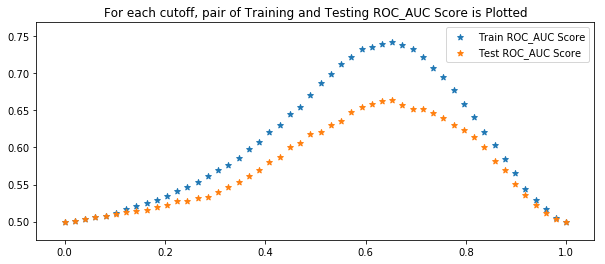

In [240]:
plt.subplots(figsize=(10,4))
plt.scatter(roc_df['index'], roc_df['train'], marker='*', label='Train ROC_AUC Score')
plt.scatter(roc_df['index'], roc_df['test'], marker='*', label='Test ROC_AUC Score')
plt.title('For each cutoff, pair of Training and Testing ROC_AUC Score is Plotted')
plt.legend()

In [234]:
roc_df.loc[roc_df['train'].argmax(),:]

index    0.653061
train    0.741485
test     0.664481
Name: 32, dtype: float64

In [235]:
roc_df.loc[roc_df['test'].argmax(),:]

index    0.653061
train    0.741485
test     0.664481
Name: 32, dtype: float64

In [236]:
test_predict['predicted_roc'] = test_predict['prob'].apply(lambda x: 1 if x < 0.653061 else 0)
train_predict['predicted_roc'] = train_predict['prob'].apply(lambda x: 1 if x < 0.653061 else 0)

In [237]:
print("Training roc_auc score is :",metrics.roc_auc_score(train_predict.actual,train_predict.predicted_roc ))
print()
print("Testing roc_auc score is :",metrics.roc_auc_score(test_predict.actual,test_predict.predicted_roc))

Training roc_auc score is : 0.7414847968607137

Testing roc_auc score is : 0.6644805876180483


In [241]:
train.head()

,Manager_Num_Products_and_Applicant_Occupation_sqrt,Application_Receipt_Date_and_Manager_Num_Products,Office_PIN_and_Application_Receipt_Date_squared,Manager_Num_Products2_and_Manager_Num_Coded_sqrt,Manager_Num_Products2_and_Office_PIN_sqrt,Applicant_Occupation_and_Manager_DoB,Manager_Grade_and_Manager_Num_Products_sqrt,Manager_Num_Coded_and_Application_Receipt_Date_ln,Applicant_City_PIN_and_Manager_Num_Application_sqrt,Manager_Num_Products2_and_Applicant_Occupation_squared,...,Applicant_BirthDate_and_Manager_Grade,Manager_Business2_and_Manager_Num_Products2_squared,Manager_Num_Application_and_Applicant_BirthDate_squared,Applicant_Qualification_and_Manager_Joining_Designation_ln,Manager_Num_Products2_and_Applicant_City_PIN_sqrt,Applicant_City_PIN_ln,Manager_DOJ_and_Manager_DoB_squared,Manager_Num_Application_and_Manager_Num_Products_ln,Applicant_City_PIN_and_Applicant_BirthDate_ln,Business_Sourced
ID,,,,,,,,,,,,,,,,,,,,,
FIN1000001,1.825742,0.235294,0.046542,1.818706,1.797434,0.346154,1.809068,1.438202,1.831955,0.074380,...,0.336621,0.140625,0.110470,1.475152,1.809068,1.466496,0.104671,1.504077,1.476391,0.0
FIN1000002,1.825742,0.235294,0.046542,1.818706,1.797434,0.346154,1.809068,1.438202,1.831955,0.074380,...,0.328042,0.140625,0.102661,1.461916,1.809068,1.466496,0.104671,1.504077,1.465205,1.0
FIN1000003,1.886796,0.370370,0.046542,1.819435,1.814970,0.304878,1.834022,1.449811,1.818760,0.332840,...,0.380165,0.171921,0.160945,1.461916,1.783765,1.466496,0.079102,1.491655,1.468414,0.0
FIN1000004,1.831622,0.263158,0.046542,1.828348,1.833030,0.335350,1.855921,1.449811,1.817669,0.125911,...,0.375635,0.079102,0.111734,1.461916,1.843909,1.455409,0.111111,1.484275,1.449352,0.0
FIN1000005,1.831622,0.275862,0.046542,1.800673,1.802776,0.409091,1.850471,1.438202,1.790498,0.125911,...,0.269231,0.111111,0.115829,1.461916,1.866215,1.455409,0.079102,1.462578,1.449352,0.0


In [242]:
test.head()

,Manager_Num_Products_and_Applicant_Occupation_sqrt,Application_Receipt_Date_and_Manager_Num_Products,Office_PIN_and_Application_Receipt_Date_squared,Manager_Num_Products2_and_Manager_Num_Coded_sqrt,Manager_Num_Products2_and_Office_PIN_sqrt,Applicant_Occupation_and_Manager_DoB,Manager_Grade_and_Manager_Num_Products_sqrt,Manager_Num_Coded_and_Application_Receipt_Date_ln,Applicant_City_PIN_and_Manager_Num_Application_sqrt,Manager_Num_Products2_and_Applicant_Occupation_squared,...,Manager_Business_and_Applicant_BirthDate,Applicant_BirthDate_and_Manager_Grade,Manager_Business2_and_Manager_Num_Products2_squared,Manager_Num_Application_and_Applicant_BirthDate_squared,Applicant_Qualification_and_Manager_Joining_Designation_ln,Manager_Num_Products2_and_Applicant_City_PIN_sqrt,Applicant_City_PIN_ln,Manager_DOJ_and_Manager_DoB_squared,Manager_Num_Application_and_Manager_Num_Products_ln,Applicant_City_PIN_and_Applicant_BirthDate_ln
ID,,,,,,,,,,,,,,,,,,,,,
FIN1009528,1.539364,0.28125,3721.000000,1.541849,1.525092,0.335350,1.534894,1.188469,1.524557,0.136223,...,0.330221,0.304225,0.136717,0.083254,1.215417,1.523940,1.197851,0.151796,1.206027,1.193922
FIN1009529,1.539364,0.28125,0.111111,1.541849,1.536420,0.370466,1.534894,1.188469,1.485221,0.136223,...,0.339480,0.326715,0.136717,0.110470,1.215417,1.521383,1.189743,0.198723,1.208311,1.190550
FIN1009530,1.545371,0.28125,0.111111,1.541849,1.536420,0.343373,1.542433,1.188469,1.524557,0.150678,...,0.316822,0.375635,0.136717,0.099814,1.216433,1.523940,1.197851,0.151796,1.206027,1.191726
FIN1009531,1.539364,0.28125,0.111111,1.541849,1.536420,0.335350,1.542433,1.188469,1.540724,0.136223,...,0.339480,0.329588,0.136717,0.116401,1.216433,1.540383,1.204180,0.151796,1.206027,1.217023
FIN1009532,1.496475,16.00000,1.000000,1.506928,1.538968,0.343373,1.509231,1.280934,1.554563,0.057330,...,0.330221,0.328042,0.075732,0.069956,1.252763,1.558387,1.226779,0.127794,1.178655,1.219667


In [243]:
train.to_csv("C:/Users/raghu/Desktop/Article_5/Article_6/Transformed_Train.csv")
test.to_csv("C:/Users/raghu/Desktop/Article_5/Article_6/Transformed_Test.csv")